In [1]:
#import sys
#formerPath = sys.path
#sys.path.append('./code/')
#sys.path.append('./BS/')

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import sklearn as skl


import bootstrapping
import dataSetConstruction
import backtest
import BS
import loadData
import plotTools
import SSVI
import neuralNetwork


import importlib

Instructions for updating:
non-resource variables are not supported in the long term


# Load data with google colab 


#### DAX Data

You will find in github repository six days of data.
For each day you need to load six csv files :
- *underlying.csv* for the stock value.
- *locvol.csv* for the local volatility calibrated with tree pricing and tikhonov volatility (see Crépey (2002)).
- *dividend.csv* for dividend extracted from put-call parity.
- *discount.csv* for zero-coupon curve. 
- *dataTrain.csv* for prices and/or implied volatility used in training set.
- *dataTest.csv* for prices and/or implied volatility used in testing set.

In [ ]:
#Load csv files to get data
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  

ModuleNotFoundError: No module named 'google.colab'

In [ ]:
workingFolder = "./data/09082001/"

Bootstrap discounting


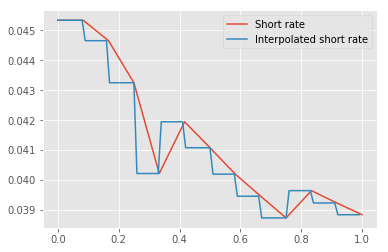

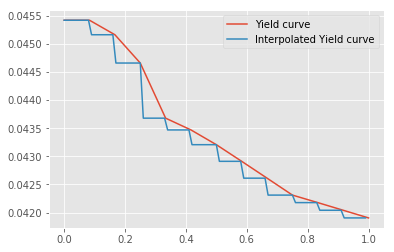

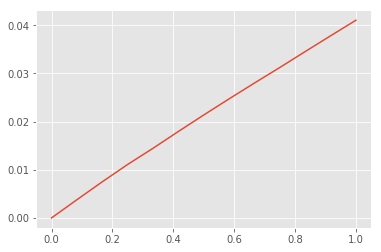

Bootstrap dividend


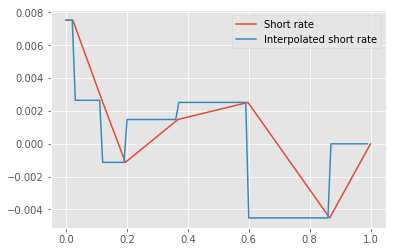

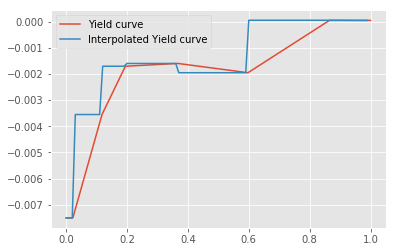

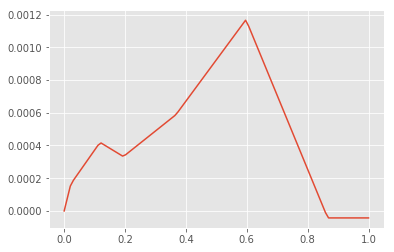

In [ ]:
#Read csv files as dataFrames
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromCSV(workingFolder,
                                                                  "9_8_2001__filterdax")

#### From Dat files

Tikhonov PDE repricing error on training set :  2.4207935408017573
Bootstrap discounting


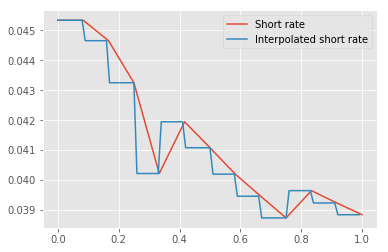

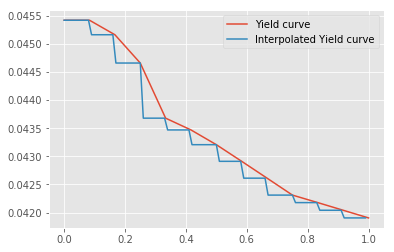

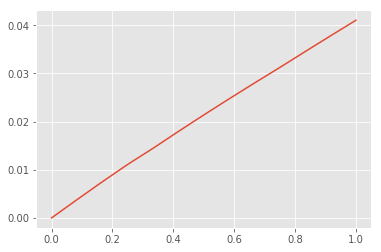

Bootstrap dividend


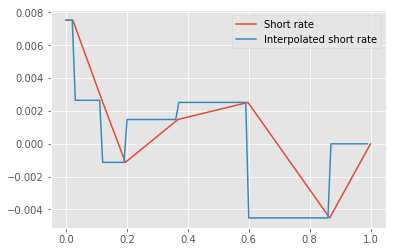

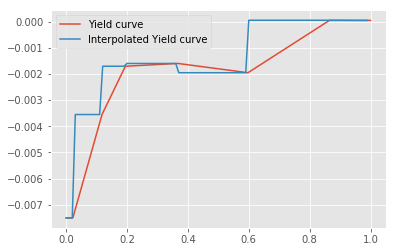

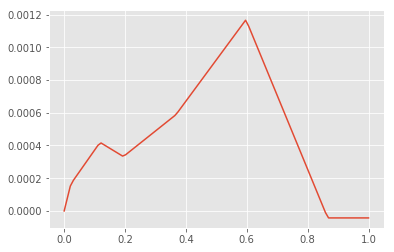

In [ ]:
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromDat(workingFolder,
                                                                  "9_8_2001__filterdax")

In [ ]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [ ]:
pd.options.mode.chained_assignment = 'raise'

#### SPX Data

We assume a piecewise constant discount short rate $r$ and a piecewise constant dividend short rate $q$.

We estimate the "zero coupon dividend" $D(T) = e^{-\int_{0}^{T} q_s ds}$ by regressing it against maturity :
$$e^{-\int_{0}^{T} q_s ds} = \frac{C(T,K) - P(T,K) + K e^{-\int_{0}^{T} r_s ds}}{S_0}$$


Then we have $\hat{q}_t = - \frac{ \log{D(\overline{T})} - \log{D(\underline{T})} }{ \overline{T} - \underline{T} }$ with $\overline{T}$ the smallest discretized maturity greater than $T$ and $\underline{T}$ the grestest discretized maturity inferior than $T$.

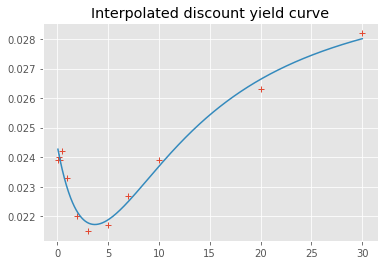

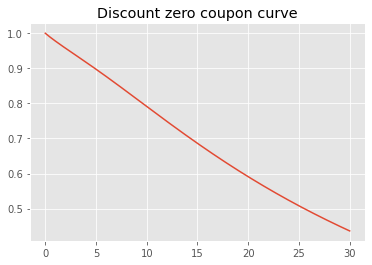

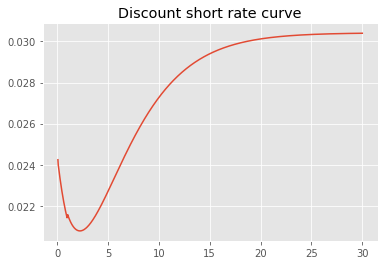

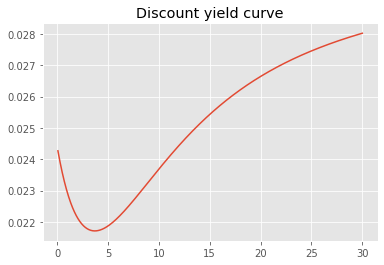

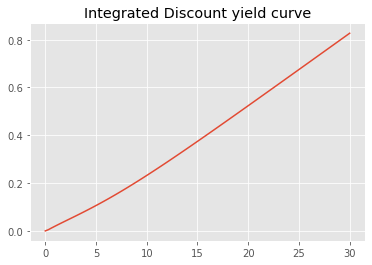

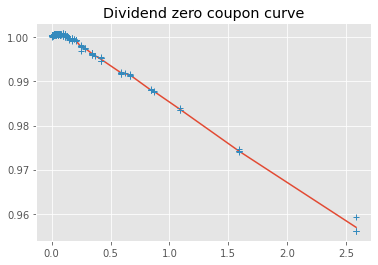

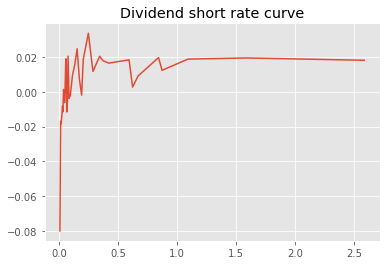

/content/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


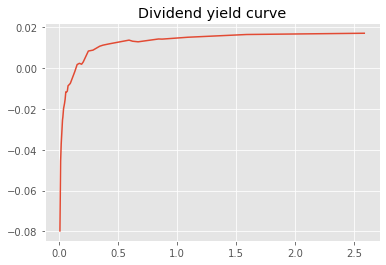

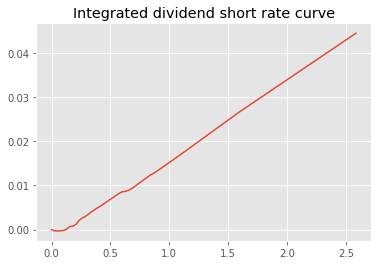

In [2]:
workingFolder = "./"#"./data/"
fileName = "Option_SPX_18_Mai_2019Feuille2.xlsm"
asOfDate = "2019-05-18"
trainingSet, testingSet, bootstrap, S0 = loadData.loadCBOTData(workingFolder, fileName, asOfDate)

In [ ]:
importlib.reload(loadData)

<module 'loadData' from '/content/loadData.py'>

####  Eurostoxx data

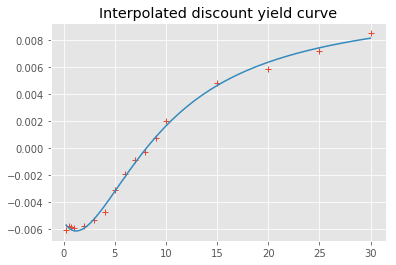

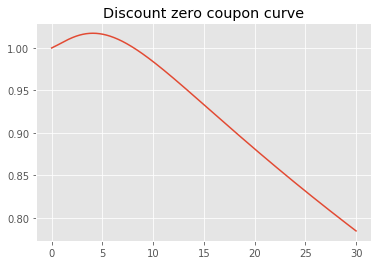

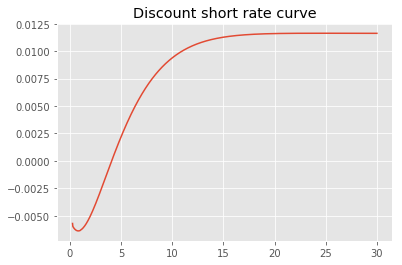

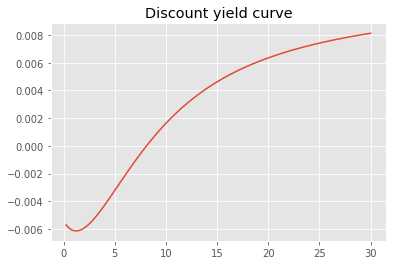

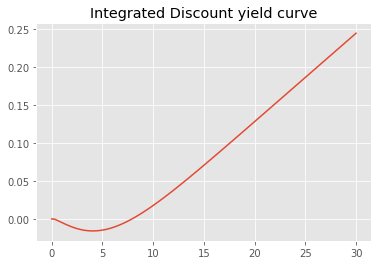

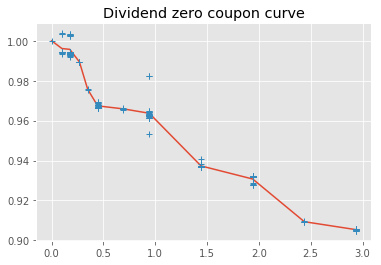

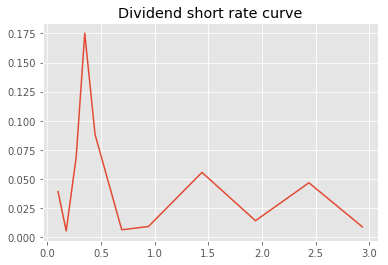

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


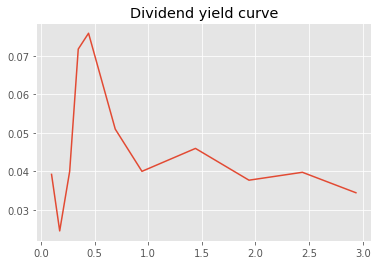

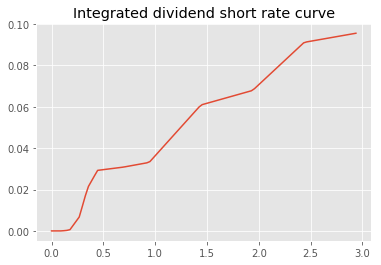

In [ ]:
workingFolder = "./data/"
asOfDate = "2019-01-10"
filename = "Data_EuroStoxx50_20190110_all_for_Marc.xlsx"
trainingSet, testingSet, bootstrap, S0 = loadData.loadESXData(workingFolder, filename, asOfDate)

In [ ]:
bootstrap.discountShortRate(10)

array(0.009402)

# Formatting data

### Boostsrapping Rate Curve


- For bootstrapping short rate $r$ and dividend rate $q$, we assume piecewise constant short rate for risk free rate and dividend i.e. 
$\exp{(-\int_{0}^{T} r_t d_t)} = \exp{(-\sum_{i} r_i h)}$ and $\exp{(\int_{0}^{T} q_t d_t)} = \exp{(\sum_{i} q_i h)}$.
- $\forall i \in \{0,..,N\}$ with $ t_0 = 0$ and $t_N = T$, we have that $\frac{\log{B(0,t_{i+1})} - \log{B(0,t_i)}}{h} = r_i$ with $B(0,T_i)$ the price of a bond expiring at time $t_i$. 
- For dividend, we just to substitute $B(0,T_i)$ with with spot action price plus dividend cash flow received until time $T_i$ i.e. $S_{t_0} + \sum\limits_i Div_{t_i}$.
- Then we linearly interpolate $r$ and $q$.
-  Linear interpolation is also used for integrals $\int_{0}^{T} q_t d_t$ and $\int_{0}^{T} r_t d_t$ in order to obtain discount factor or dividend factor. 

**riskFreeIntegral** corresponds to $I_T = \int_{0}^{T} r_u du$.
**riskFreeSpline**  corresponds to $r_u$ evaluated on a subgrid. Interpolated as step function from zero coupons

**divSpreadIntegral** corresponds to $I_T = \int_{0}^{T} q_u du$, can be negative.
**divSpline**  corresponds to $q_u$ evaluated on a subgrid, can be negative.

Training dataset is built on market prices observed on the dax.
Testing dataset is list of prices drawn from an excel provided by Stephane Crépey.
Prices come from the calibrated local volatility with tikhonov regularisation (see Crépey 2002 paper).
Implied volatitilities in both dataset are obtained from local volatility.

These curve satisfy together the call put parity.

Spot level is contained in underlying.csv

### Pricing black-scholes price

#### Change of variable

- In presence of dividend rate $d$ and risk free rate $r$ Dupire formula is :   $$\sigma^2(T,K) = 2 \frac{ \partial_T P(T,K) + (r-q) K \partial_K P(T,K) + qP(T,K)}{K² \partial_{K}^2 P(T,K)}$$ 
with Strike $K$, Maturity $T$, dividend rate $q$ and risk-free rate $r$, $P$ our pricing function. 
- We apply the following change of variable : $$ w(T,k) = \exp{(\int_{0}^{T} q_t dt)} P(T,K)$$ with $K = k \exp{(\int_{0}^{T} (r_t - q_t) dt)} $.

- Then Dupire equation becomes :  $\sigma^2(T,K) = 2 \frac{ \partial_T w(T,k)}{k² \partial_{k}^2 w(T,k)}$. 
- If we learn the mapping $v$ with a neural network then we should obtain quickly by adjoint differentiation $\partial_T w$ and $\partial_{k²}^2 w$ and therefore $\sigma$.


In [ ]:
dataSetConstruction.checkCallPutParity(pd.concat([trainingSet, testingSet]), 
                                       S0, 
                                       bootstrap)

In [3]:
dataSet = trainingSet #Training set
dataSetTest = testingSet #Testing set
dataSet.head()

Price     Delta  ...  logMoneyness  impliedTotalVariance
Strike Maturity                   ...                                    
2300.0 0.419     14.30 -0.069169  ...     -0.220227              0.024620
2350.0 0.093      1.20 -0.013019  ...     -0.196766              0.008143
       0.112      1.85 -0.018041  ...     -0.197041              0.009257
2400.0 0.419     20.55 -0.099289  ...     -0.177667              0.021477
2550.0 0.112      6.25 -0.063439  ...     -0.115363              0.006013

[5 rows x 15 columns]

In [4]:
dataSetTest.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
1700.0,0.246,0.80,-0.004171,17.445534,0.009788,-1.763062e-05,15.329284,1697.643924,0.997527,1700.0,0.246,0.4147,0.062925,-1.0,-0.521416,0.042306
2200.0,0.419,9.95,-0.047968,184.678148,0.094049,-9.963912e-07,103.538455,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171846,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907


In [5]:
dfCurve = dataSetConstruction.savingData(bootstrap, 
                                         dataSet, 
                                         dataSetTest, 
                                         workingFolder)

Saving bootstrapping under dfCurve.csv
Saving training set under trainingDataSet.csv
Saving bootstrapping under testingDataSet.csv


In [6]:
dataSet.shape

(137, 15)

In [7]:
dataSetTest.shape

(142, 15)

In [8]:
S0

2859.53

In [9]:
def getCall(df):
    return df[df["OptionType"]==1]
def getPut(df):
    return df[df["OptionType"]==-1]

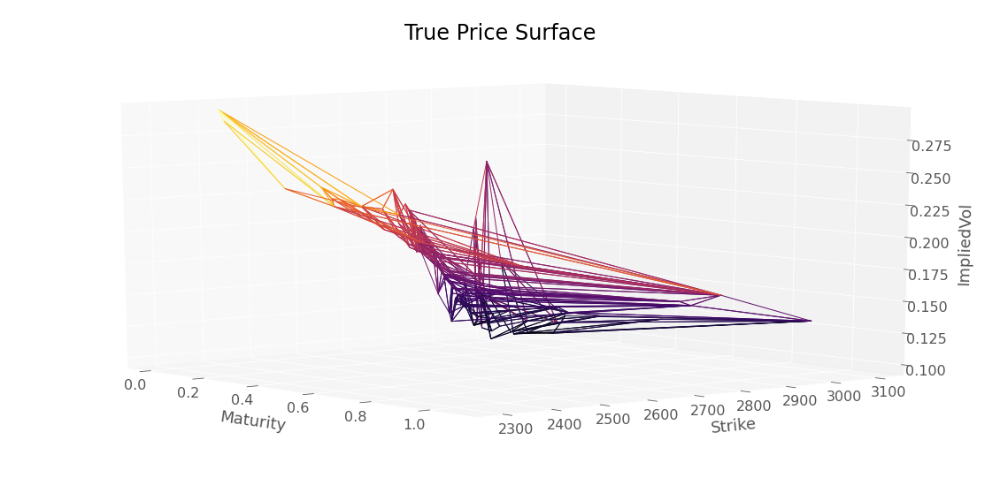

In [10]:
plotTools.plotSerie(getPut(trainingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

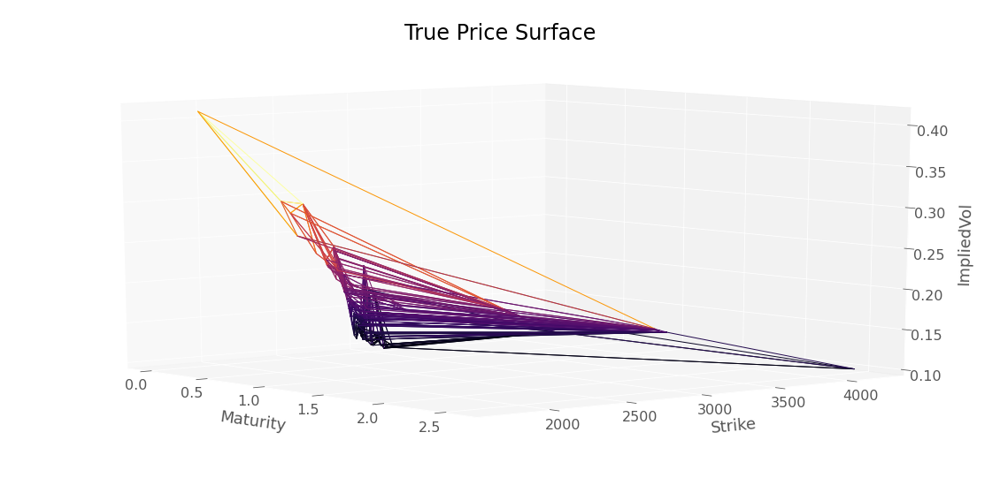

In [11]:
plotTools.plotSerie(getPut(testingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

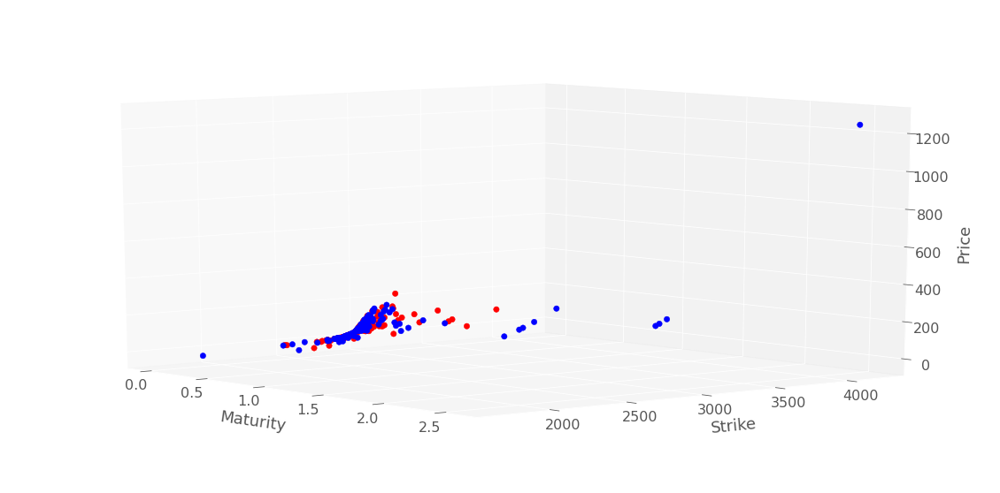

In [12]:
plotTools.plot2Series(getPut(testingSet)["Price"], 
                      getPut(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0, 
                      Title = 'True Price Surface')

In [13]:
testingSet.shape

(142, 15)

In [14]:
trainingSet.shape

(137, 15)

In [15]:
dataSet.head()

Price     Delta  ...  logMoneyness  impliedTotalVariance
Strike Maturity                   ...                                    
2300.0 0.419     14.30 -0.069169  ...     -0.220227              0.024620
2350.0 0.093      1.20 -0.013019  ...     -0.196766              0.008143
       0.112      1.85 -0.018041  ...     -0.197041              0.009257
2400.0 0.419     20.55 -0.099289  ...     -0.177667              0.021477
2550.0 0.112      6.25 -0.063439  ...     -0.115363              0.006013

[5 rows x 15 columns]

## Scaling methods

Use min-max of scaling strike between 0 et 1 for improving stability of neural network training. 

In [16]:
dataSet["locvol"] = np.ones_like(dataSet["ImpliedVol"]) 
dataSetTest["locvol"] = np.ones_like(dataSetTest["ImpliedVol"]) 

In [17]:
scaler = skl.preprocessing.MinMaxScaler(feature_range=(0, 1))
scaler.fit(dataSet)
scaledDataSet = neuralNetwork.transformCustom(dataSet, scaler)
scaledDataSetTest = neuralNetwork.transformCustom(dataSetTest, scaler)

In [18]:
scaledDataSet.head()

Price     Delta  ...  impliedTotalVariance  locvol
Strike Maturity                   ...                              
2300.0 0.419     14.30 -0.069169  ...              0.024620     1.0
2350.0 0.093      1.20 -0.013019  ...              0.008143     1.0
       0.112      1.85 -0.018041  ...              0.009257     1.0
2400.0 0.419     20.55 -0.099289  ...              0.021477     1.0
2550.0 0.112      6.25 -0.063439  ...              0.006013     1.0

[5 rows x 16 columns]

In [19]:
#Search strike for ATM option
midS0 = dataSet[dataSet.index.get_level_values("Strike") >= S0].index.get_level_values("Strike").min()

## Plot functions

In [20]:
KMin = 0#0.7 * S0[0]
KMax = 2.0 * S0#1.3 * S0[0]


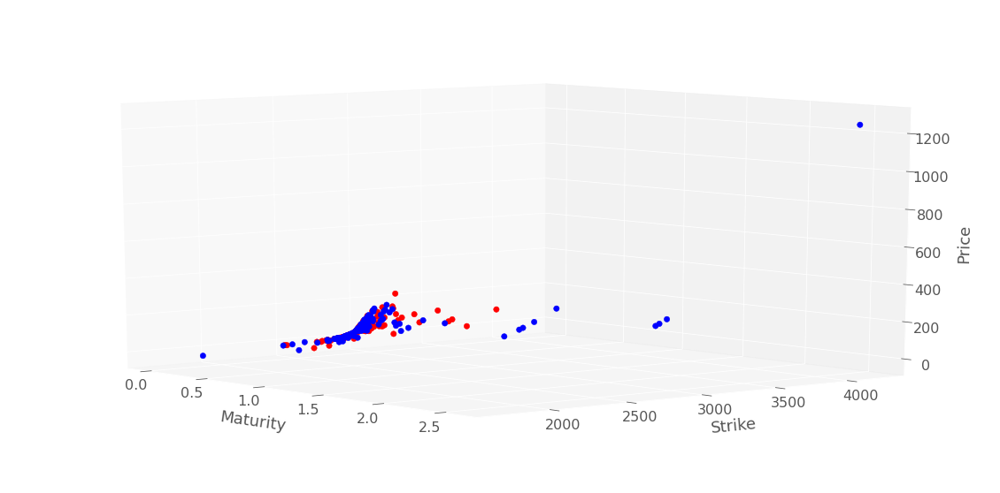

In [21]:
plotTools.plot2Series(dataSetTest[dataSetTest.Maturity > 0]["Price"], 
                      dataSet[dataSet.Maturity > 0]["Price"], 
                      yMin=KMin,
                      yMax=KMax, 
                      Title = 'True Price Surface')

In [22]:
importlib.reload(plotTools)

<module 'plotTools' from '/content/plotTools.py'>

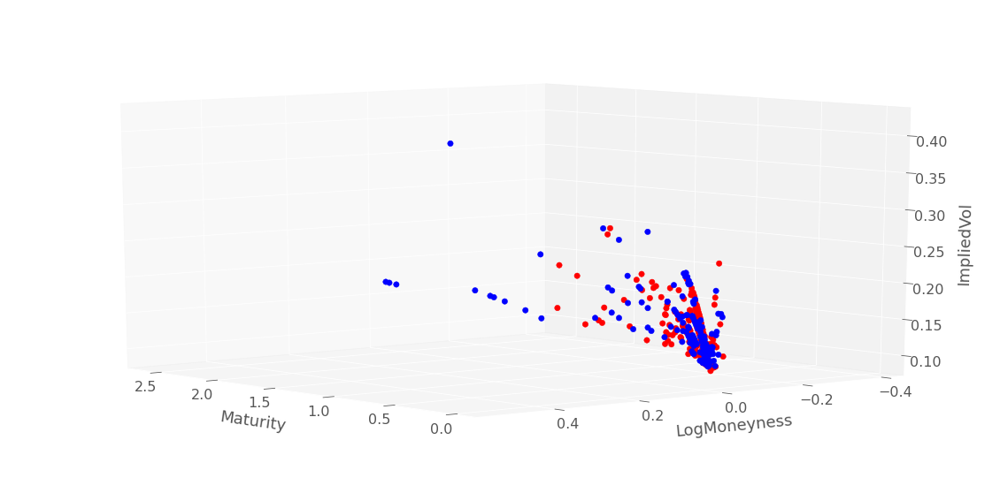

In [23]:
plotTools.plot2Series(plotTools.convertToLogMoneyness(dataSetTest[dataSetTest.Maturity > 0], S0)["ImpliedVol"], 
                      plotTools.convertToLogMoneyness(dataSet[dataSet.Maturity > 0], S0)["ImpliedVol"], 
                      yMin=-1000,
                      yMax=1000, 
                      Title = 'True Implied vol Surfaces', 
                      az=140)

In [24]:
plt.get_cmap("plasma")(0)

(0.050383, 0.029803, 0.527975, 1.0)

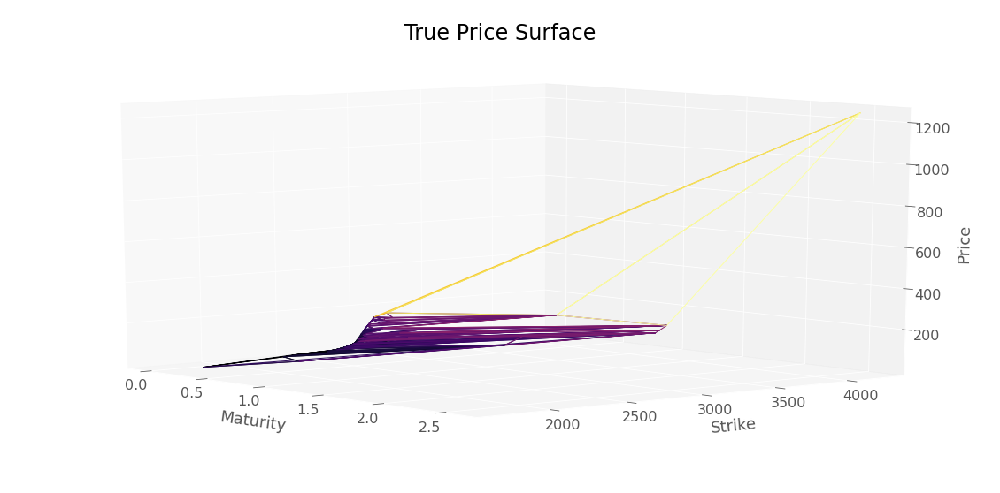

In [25]:
plotTools.plotSerie(dataSetTest[dataSetTest.Maturity > 0]["Price"], 
                    yMin=KMin,
                    yMax=KMax, 
                    Title = 'True Price Surface')

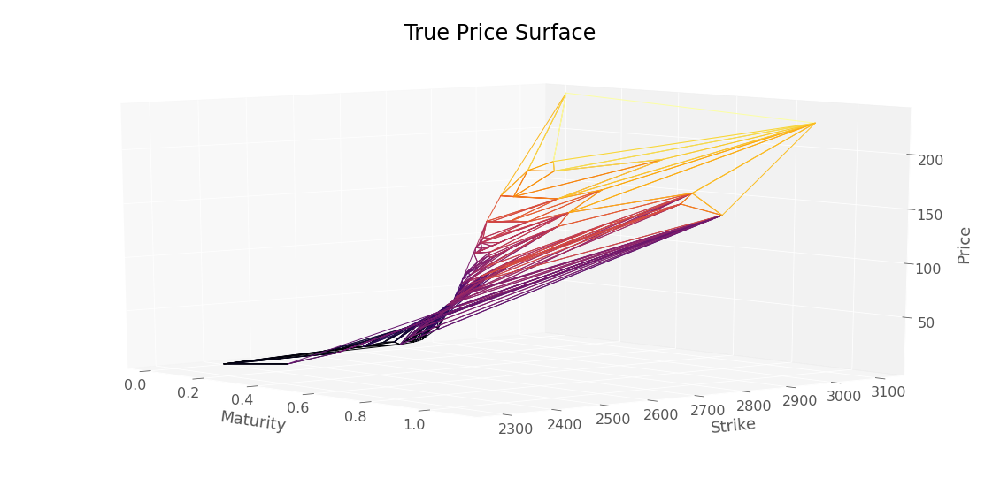

In [26]:
plotTools.plotSerie(dataSet["Price"],
                    yMin=KMin,
                    yMax=KMax, 
                    Title = 'True Price Surface')

In [27]:
neuralNetwork.inverseTransform(scaledDataSet, scaler).head()

Price     Delta  ...  impliedTotalVariance  locvol
Strike Maturity                   ...                              
2300.0 0.419     14.30 -0.069169  ...              0.024620     1.0
2350.0 0.093      1.20 -0.013019  ...              0.008143     1.0
       0.112      1.85 -0.018041  ...              0.009257     1.0
2400.0 0.419     20.55 -0.099289  ...              0.021477     1.0
2550.0 0.112      6.25 -0.063439  ...              0.006013     1.0

[5 rows x 16 columns]

### Implied volatility function calibration by bissection

In [28]:
%matplotlib inline

# Learning Implied volatility

Best loss (hidden nodes: 50, iterations: 1): 3.87
Best Penalization :  [21.020807, [21.603836, 3.308089e-05, 5.43353]]
Training Time :  1.4408495426177979

In [29]:
hyperparameters = {}
#penalization coefficient
hyperparameters["lambdaLocVol"] = 0.11#1#0.001#0.01 #100
hyperparameters["lambdaSoft"] = 1#100#0.0001#10#10 #100 
hyperparameters["lambdaGamma"] = 10#10000#100#10 #10000

#Derivative soft constraints parameters
hyperparameters["lowerBoundTheta"] = 0.01
hyperparameters["lowerBoundGamma"] = 0.00001

#Local variance parameters
hyperparameters["DupireVarCap"] = 10
hyperparameters["DupireVolLowerBound"] = 0.05
hyperparameters["DupireVolUpperBound"] = 0.40

#Learning scheduler coefficient
hyperparameters["LearningRateStart"] = 0.1
hyperparameters["Patience"] = 100
hyperparameters["batchSize"] = 50
hyperparameters["FinalLearningRate"] = 1e-6
hyperparameters["FixedLearningRate"] = False

#Training parameters
hyperparameters["nbUnits"] = 100 #number of units for hidden layers
hyperparameters["maxEpoch"] = 10000#10000 #maximum number of epochs

In [52]:
importlib.reload(neuralNetwork)

<module 'neuralNetwork' from '/content/neuralNetwork.py'>

In [31]:
#[0.008489941, [1.9128314e-05, 1.4595382e-07, 0.0053249267]]

In [32]:
res = neuralNetwork.create_train_model_gatheral(neuralNetwork.NNArchitectureVanillaSoftGatheral,
                                                scaledDataSet,
                                                True,
                                                hyperparameters,
                                                scaler,
                                                modelName = "convexSoftGatheralVolModel")
y_pred4G, volLocale4G, dNN_T4G, gNN_K4G, lossSerie4G = res

Iteration :  226 new learning rate :  0.010000000000000002
Best loss (hidden nodes: 100, iterations: 227): -3.61
Best Penalization :  [0.027004587, [0.0, 0.0, 0.0]]
Best Penalization (Refined Grid) :  [[0.0, 0.0, 0.0]]
Iteration :  1103 new learning rate :  0.0010000000000000002
Best loss (hidden nodes: 100, iterations: 1104): -4.71
Best Penalization :  [0.0089095365, [7.3137126e-05, 0.0, 1.4725915e-06]]
Best Penalization (Refined Grid) :  [[1.5483487e-05, 0.0, 0.00011493035]]
Iteration :  6730 new learning rate :  0.00010000000000000003
Best loss (hidden nodes: 100, iterations: 6731): -4.78
Best Penalization :  [0.008340024, [5.6047244e-05, 0.0, 5.9218696e-06]]
Best Penalization (Refined Grid) :  [[1.3537131e-05, 0.0, 5.2445885e-05]]
Iteration :  7778 new learning rate :  1.0000000000000004e-05
Best loss (hidden nodes: 100, iterations: 7779): -4.78
Best Penalization :  [0.008336583, [5.5939297e-05, 0.0, 5.8695205e-06]]
Best Penalization (Refined Grid) :  [[1.34491775e-05, 0.0, 5.14052

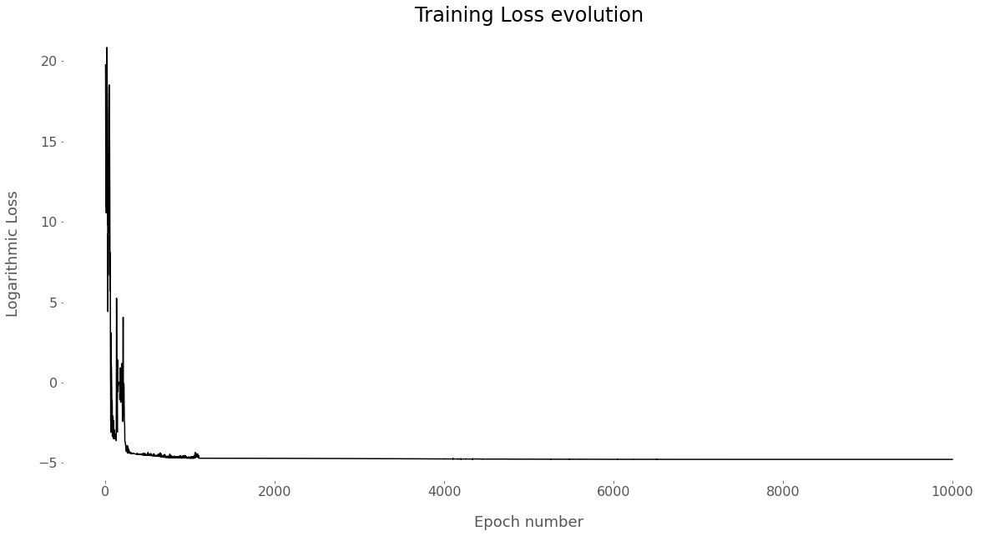

-4.779431343078613

In [33]:
plotTools.plotEpochLoss(lossSerie4G)
lossSerie4G.iloc[-1]

Best loss (hidden nodes: 100, iterations: 0): -4.78
Best Penalization :  [0.008335775, [5.581196e-05, 0.0, 5.985691e-06]]
Best Penalization (Refined Grid):  [[1.34273e-05, 0.0, 5.1328105e-05]]
Number of static arbitrage violations :  0
Arbitrable total variance :  Series([], Name: Price, dtype: float32)


/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:178: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


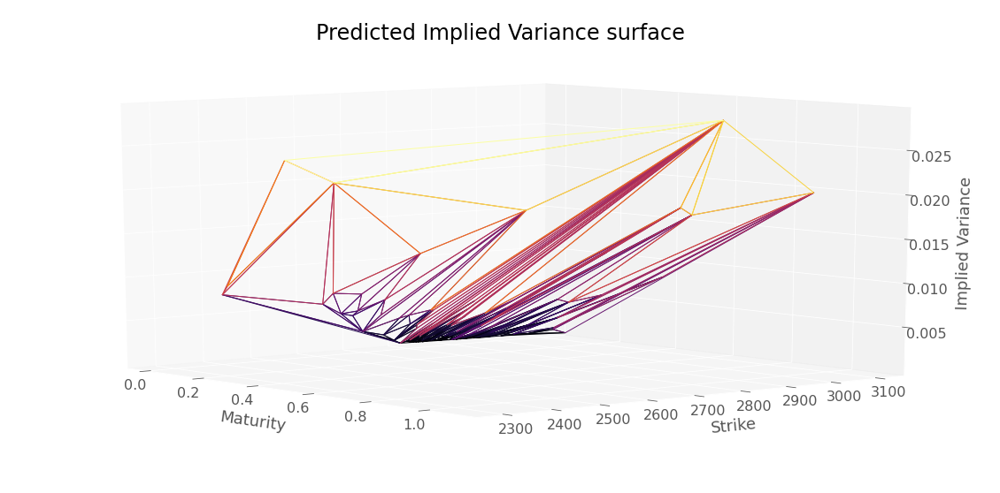

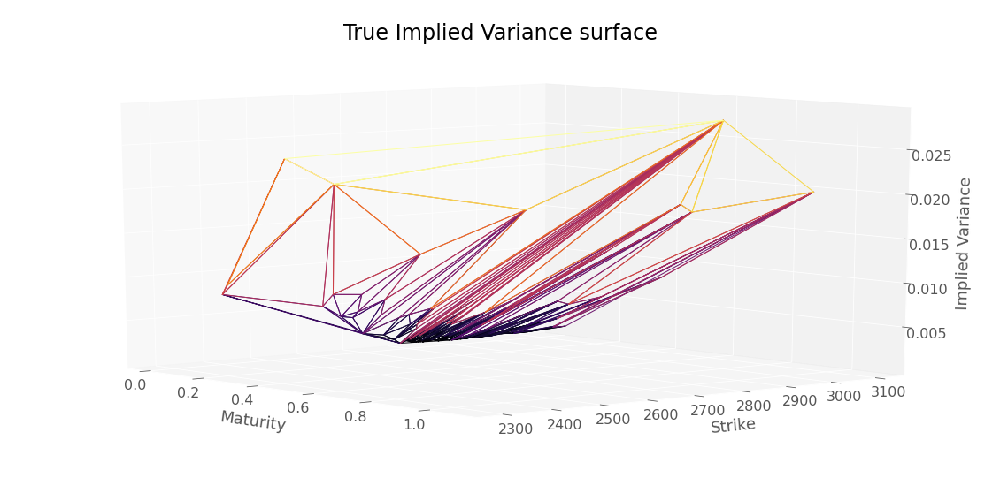

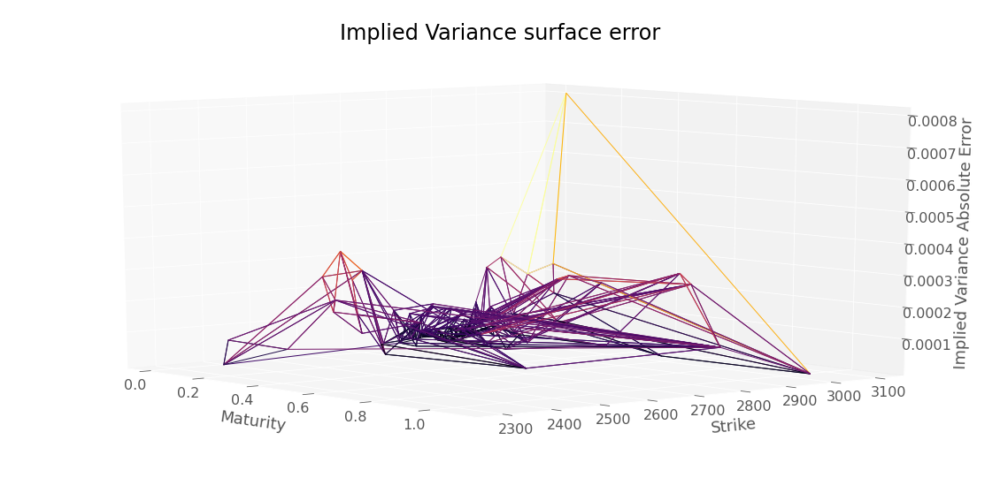

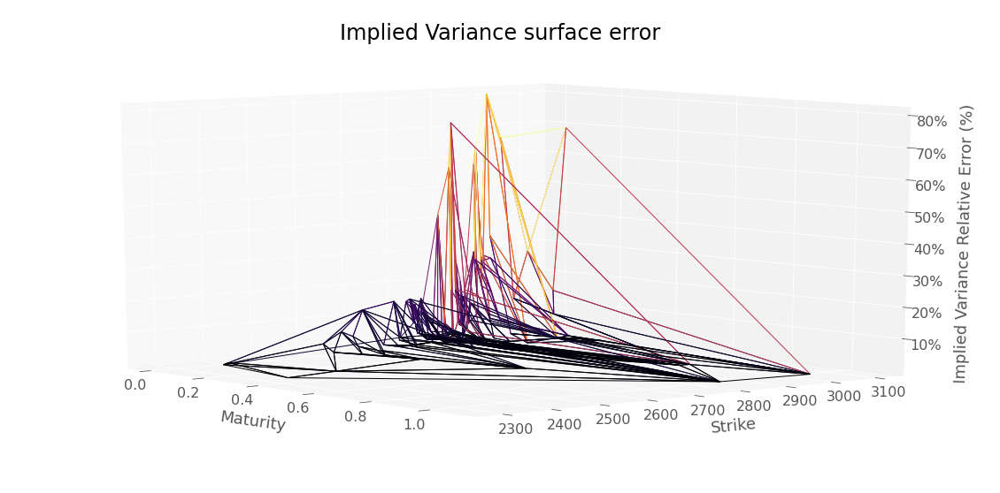

RMSE :  0.0001241504452620102


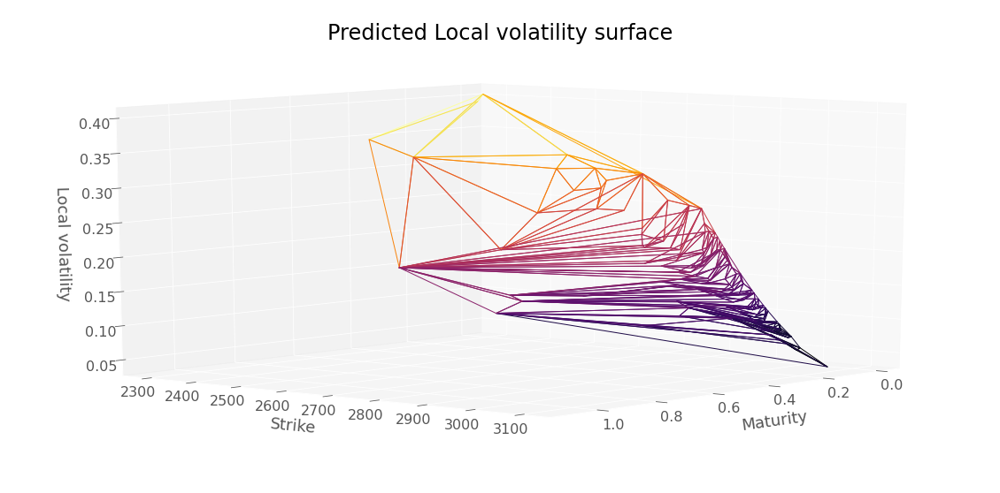

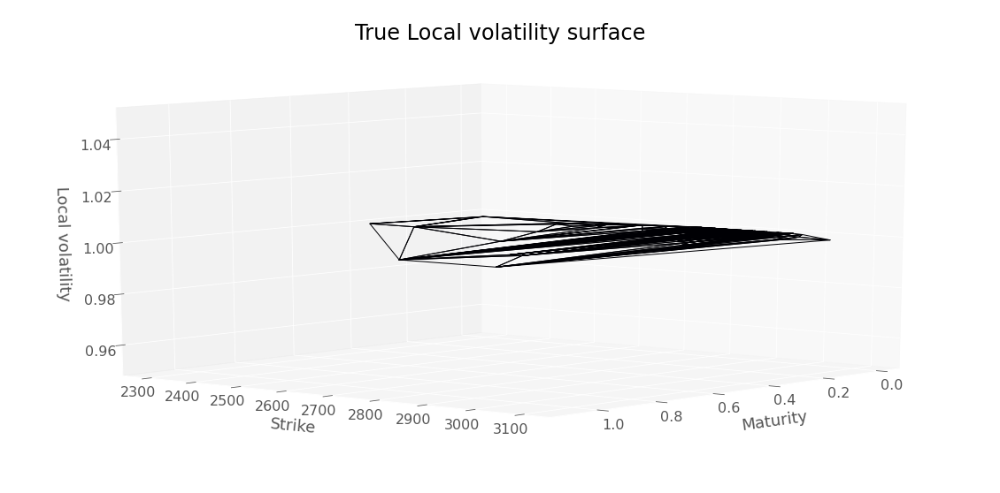

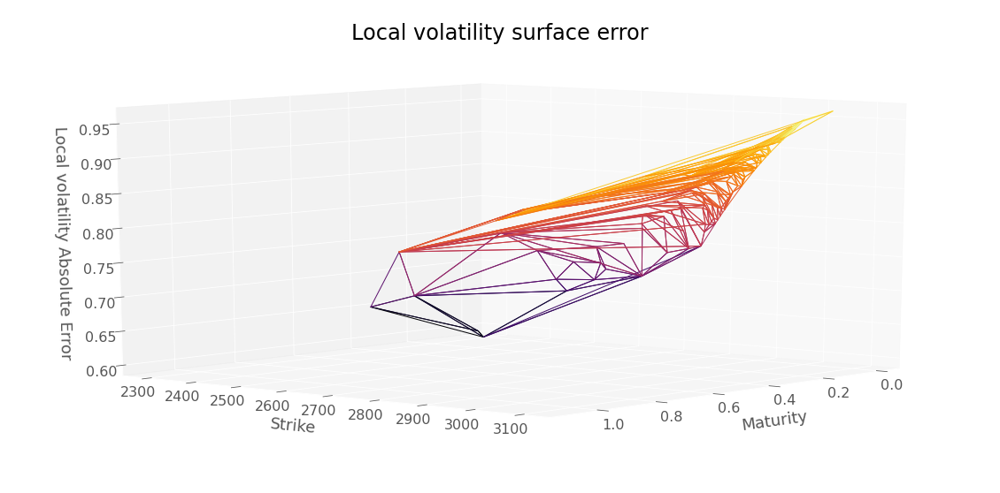

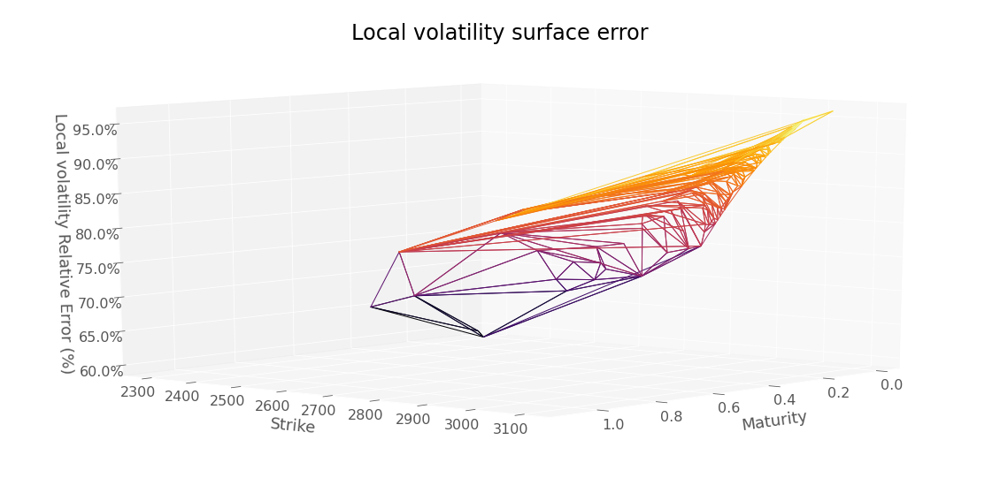

RMSE :  0.8438120362755007


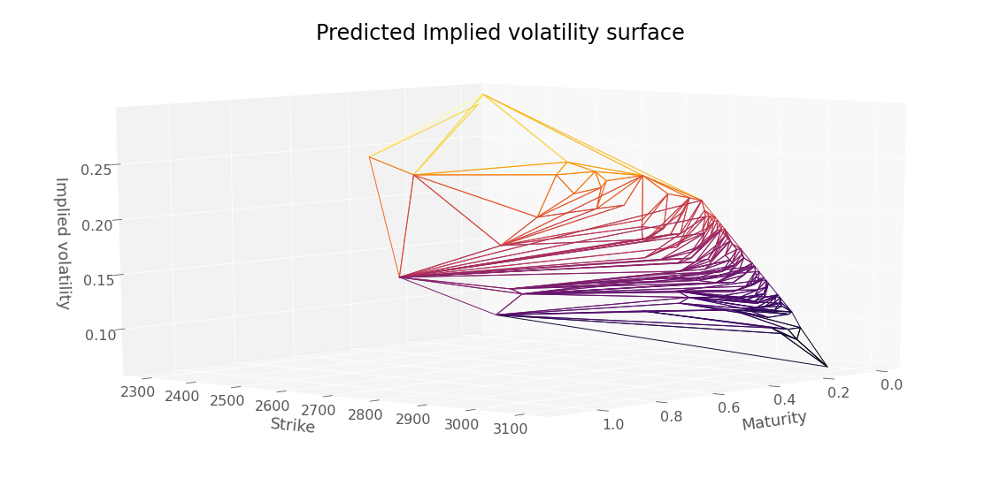

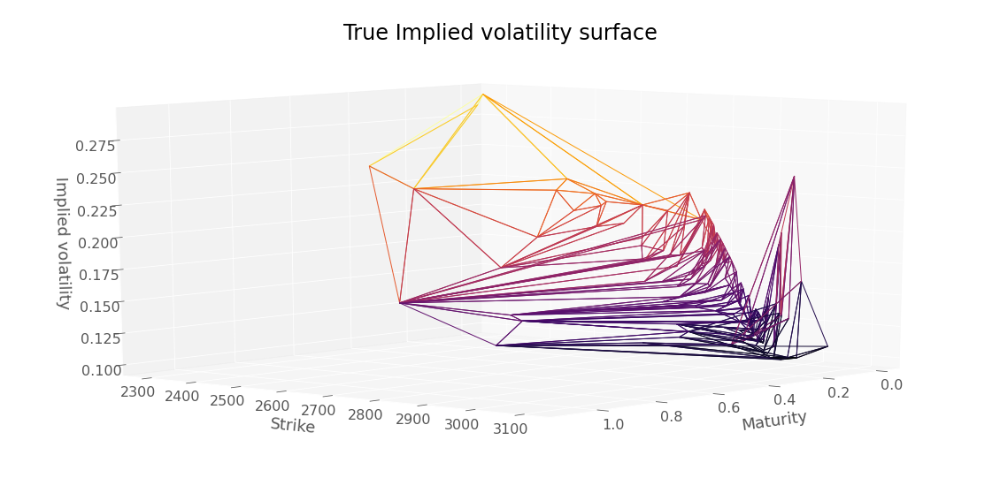

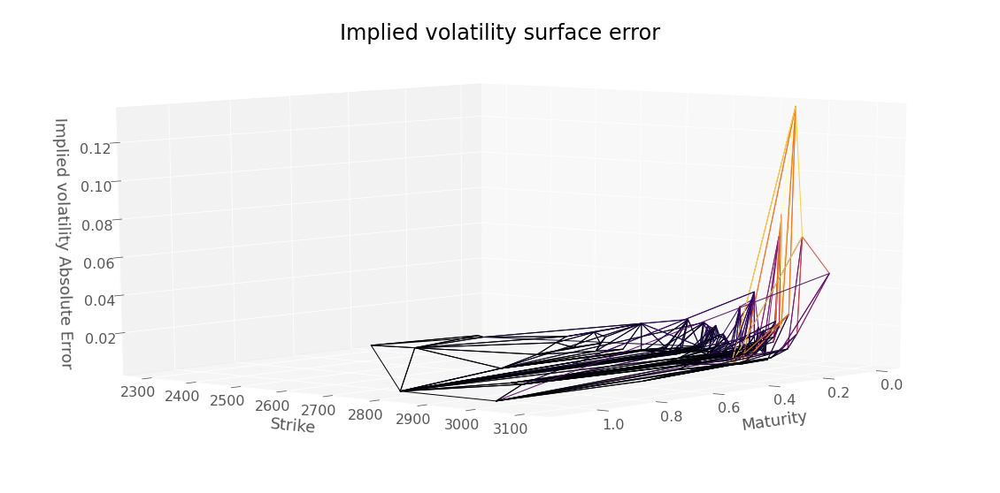

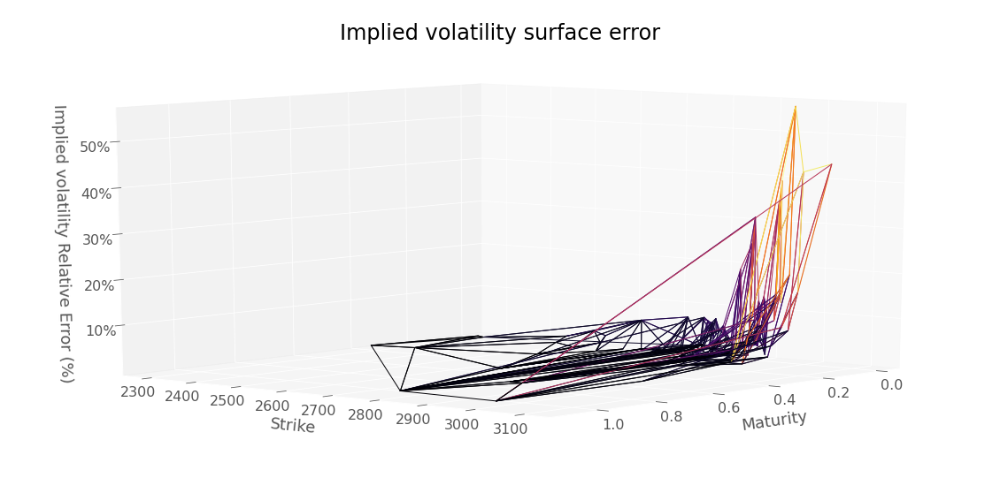

RMSE :  0.018181157771200638


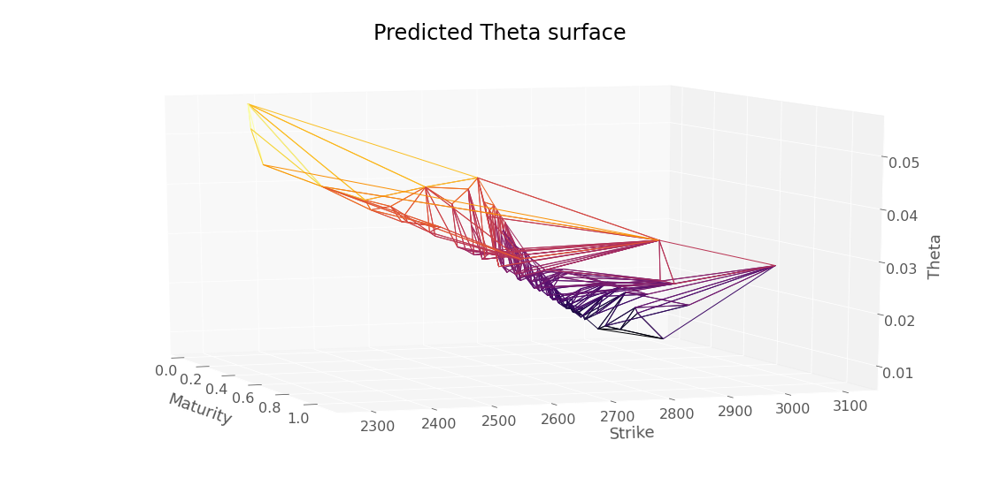

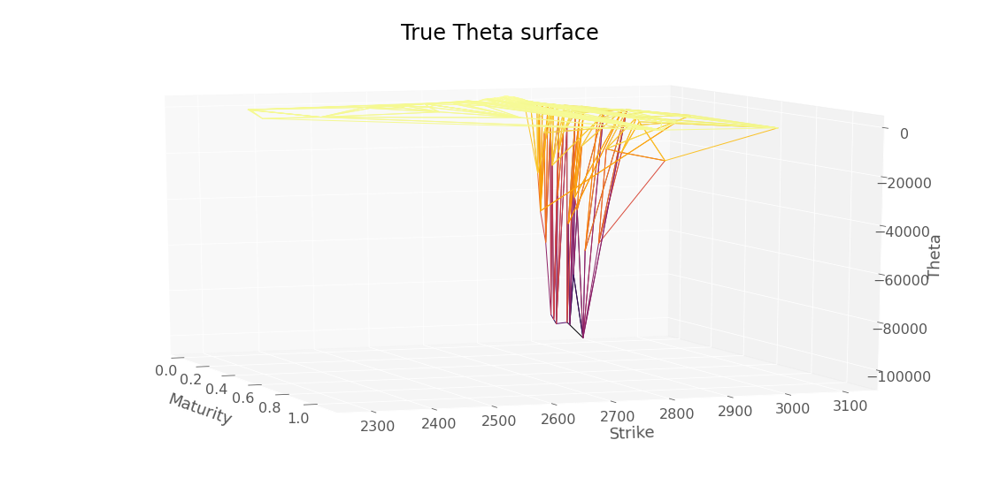

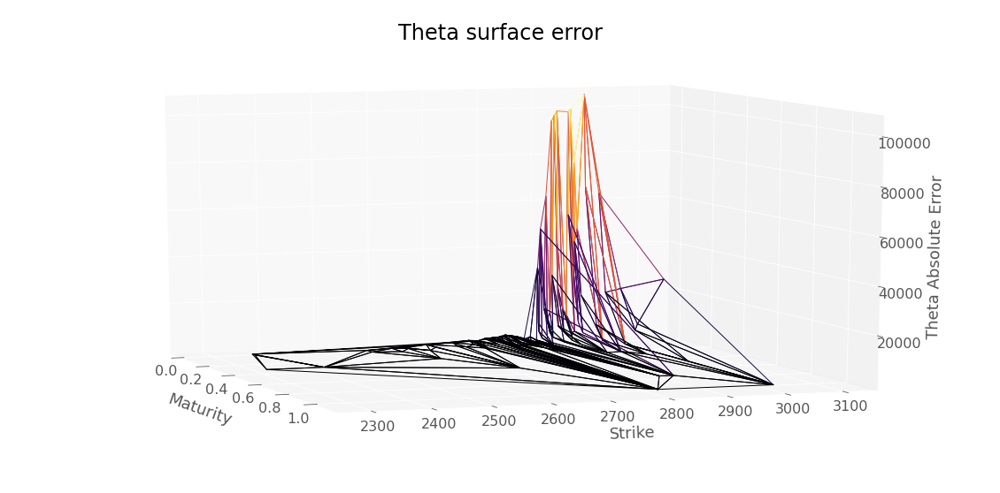

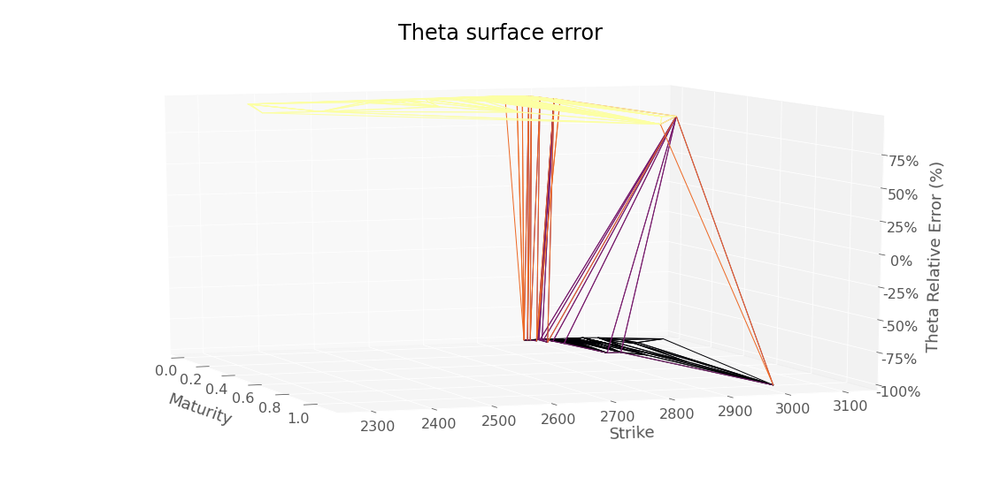

RMSE :  26380.289721260684


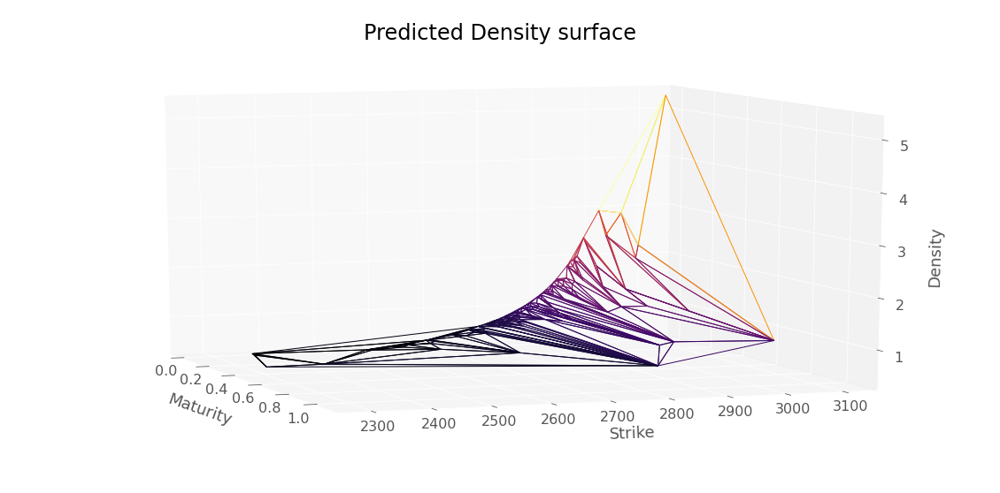

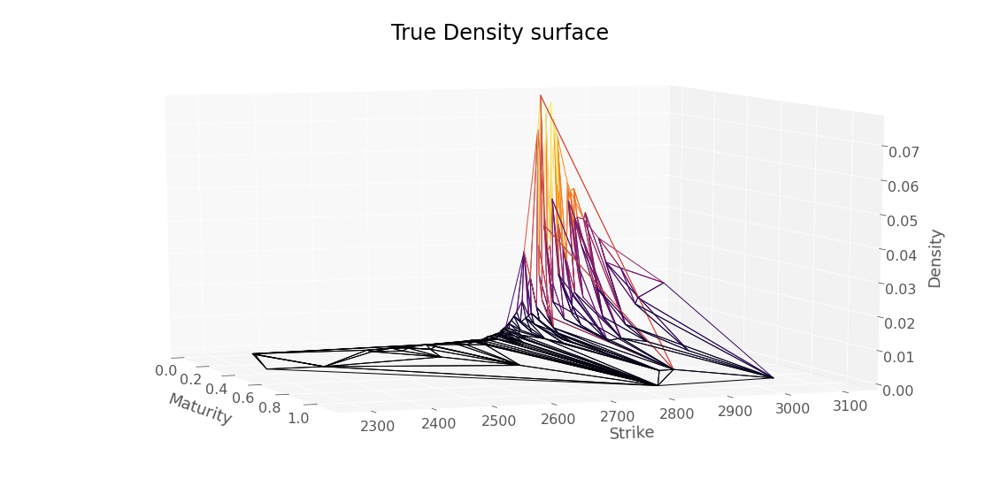

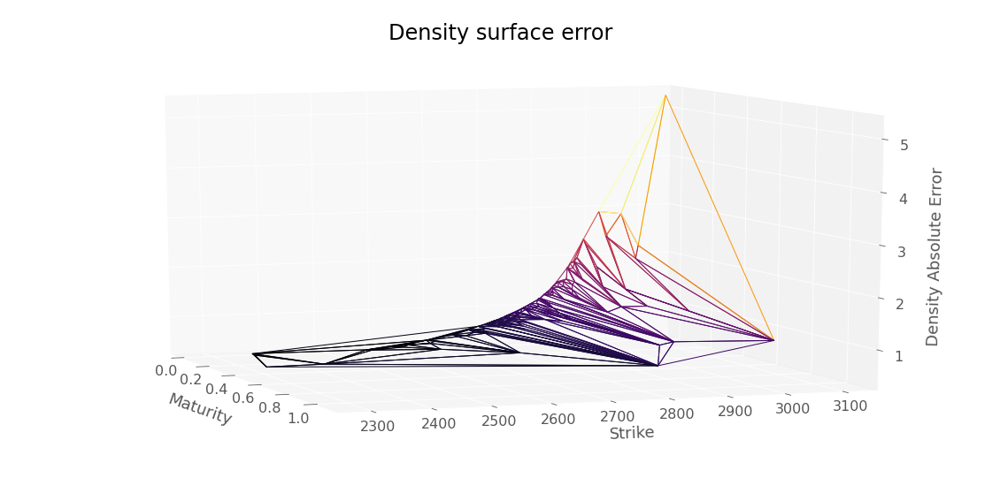

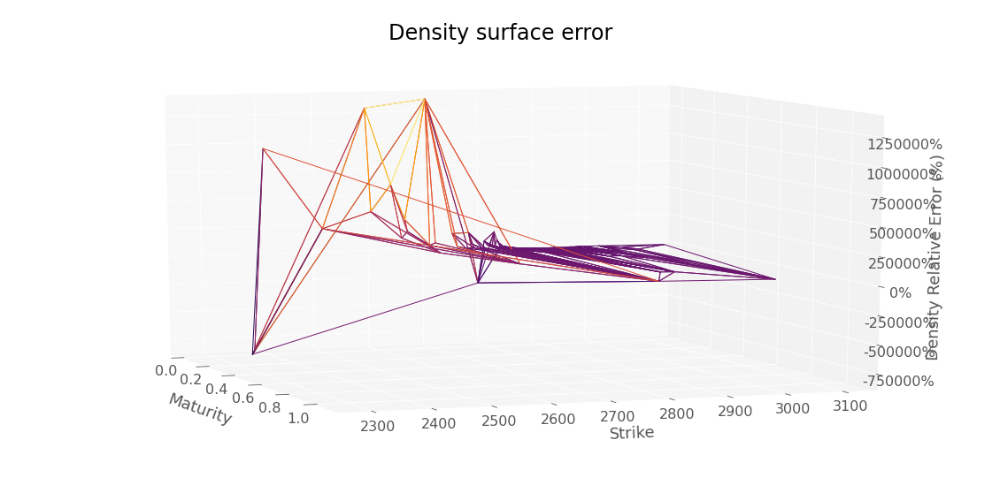

RMSE :  1.2863356570485363


In [34]:
res = neuralNetwork.create_eval_model_gatheral(neuralNetwork.NNArchitectureVanillaSoftGatheral,
                                               scaledDataSet,
                                               True,
                                               hyperparameters,
                                               scaler,
                                               modelName = "convexSoftGatheralVolModel")
y_pred4G, volLocale4G, dNN_T4G, gNN_K4G, lossSerie4G = res

plotTools.modelSummaryGatheral(y_pred4G, 
                               volLocale4G, 
                               dNN_T4G, 
                               gNN_K4G, 
                               dataSet,
                               yMin = KMin,
                               yMax = KMax)
neuralNetwork.saveDataModel(y_pred4G, 
                            volLocale4G, 
                            dNN_T4G, 
                            "convexSoftGatheralVolModelTrain")

In [35]:
volLocale4G.loc[(midS0,slice(None))]

Strike  Maturity
2860.0  0.011       0.155350
        0.036       0.140787
        0.285       0.155937
Name: Dupire, dtype: float32

Best loss (hidden nodes: 100, iterations: 0): -4.46
Best Penalization :  [0.011477921, [5.604875e-05, 0.0, 3.973794e-05]]
Best Penalization (Refined Grid):  [[1.34273e-05, 0.0, 5.1328105e-05]]
Number of static arbitrage violations :  0
Arbitrable total variance :  Series([], Name: Price, dtype: float32)


/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:178: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


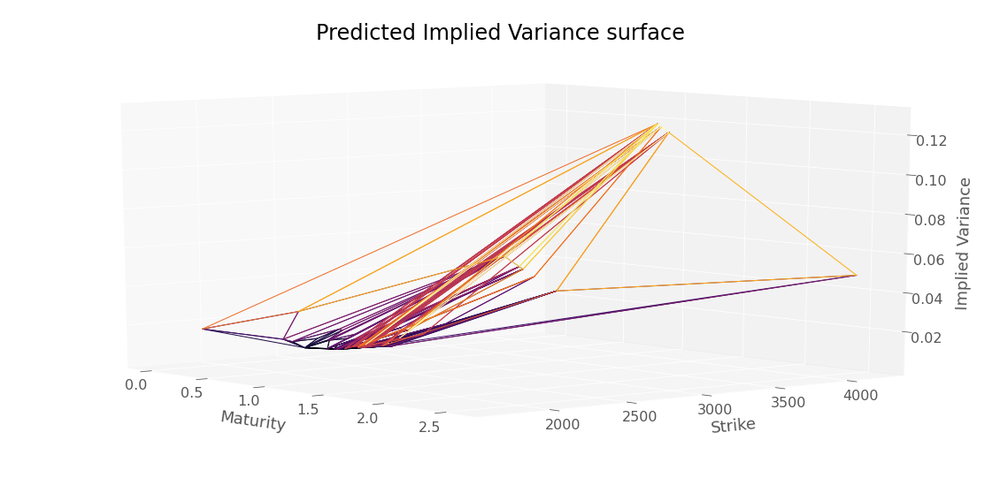

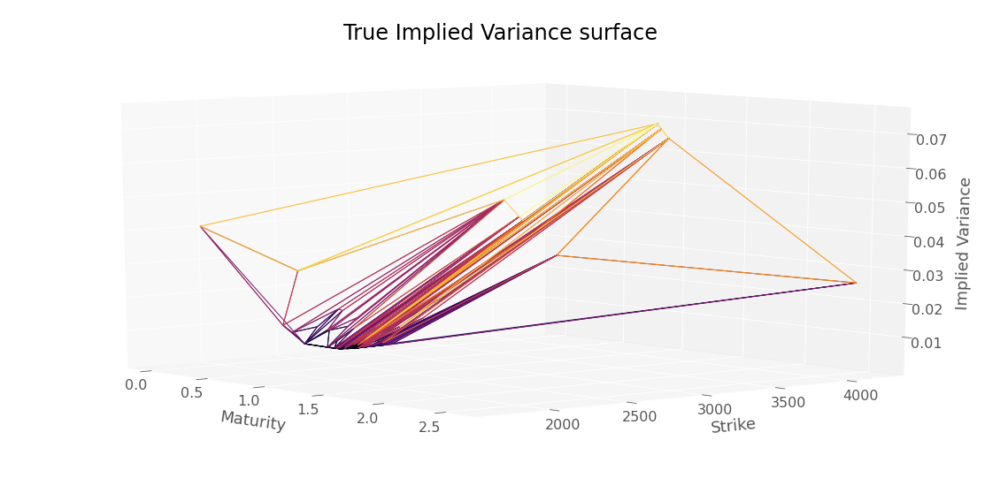

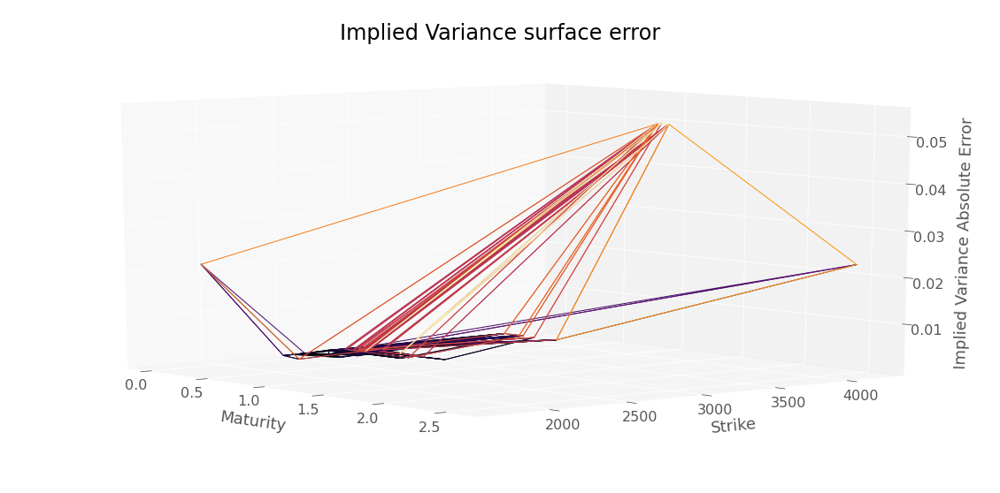

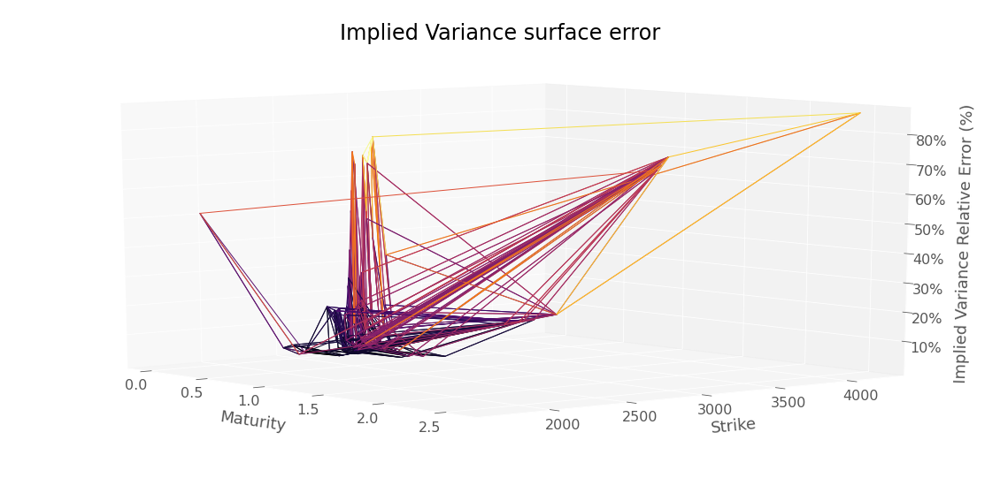

RMSE :  0.00837625431338139


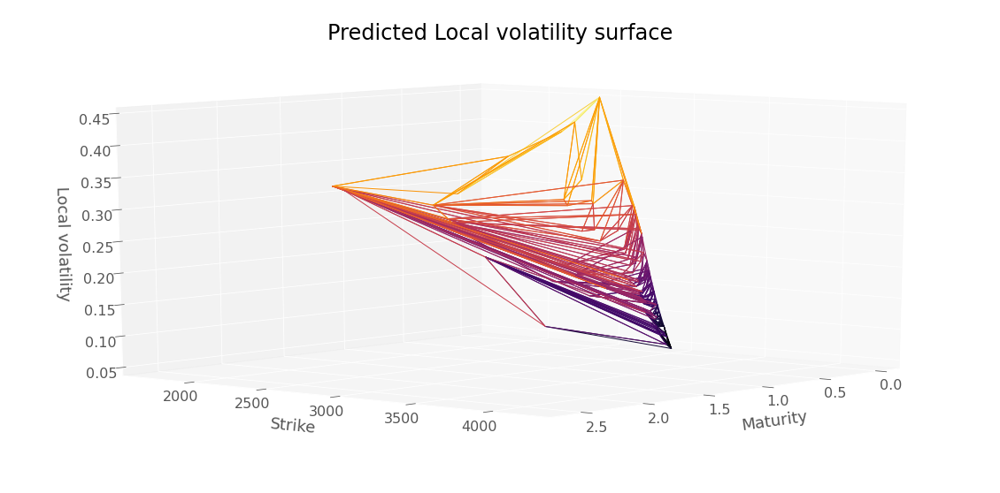

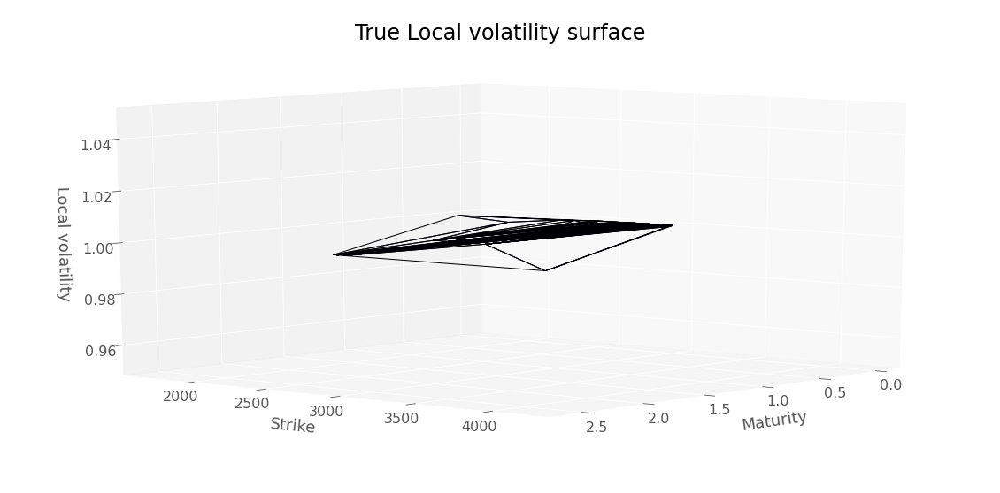

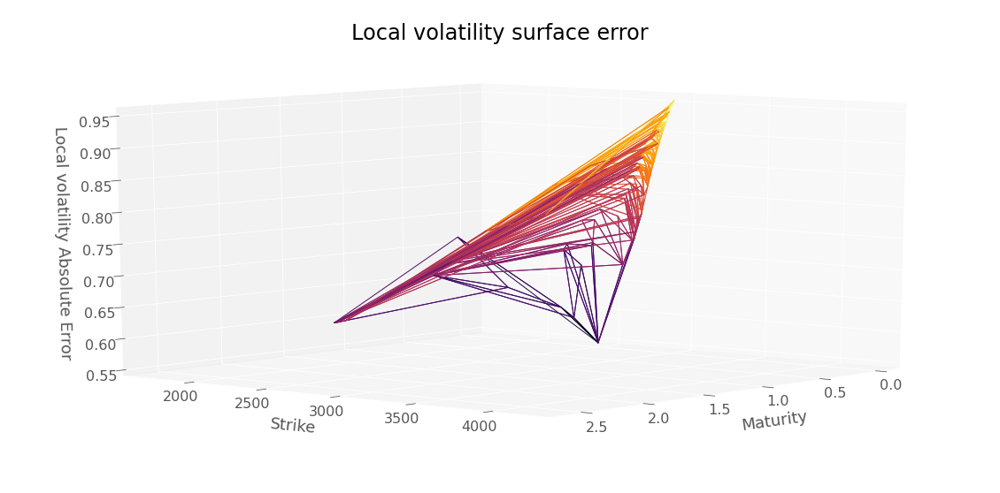

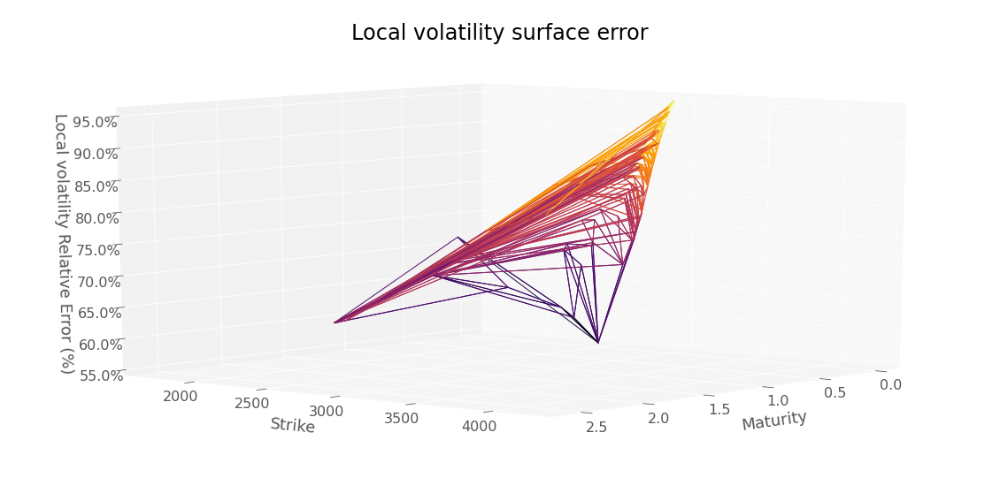

RMSE :  0.8352386792829717


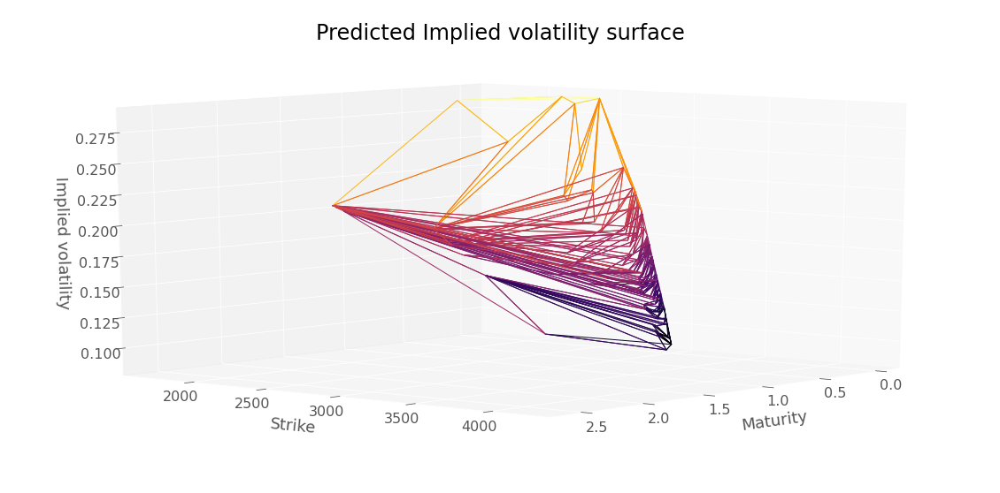

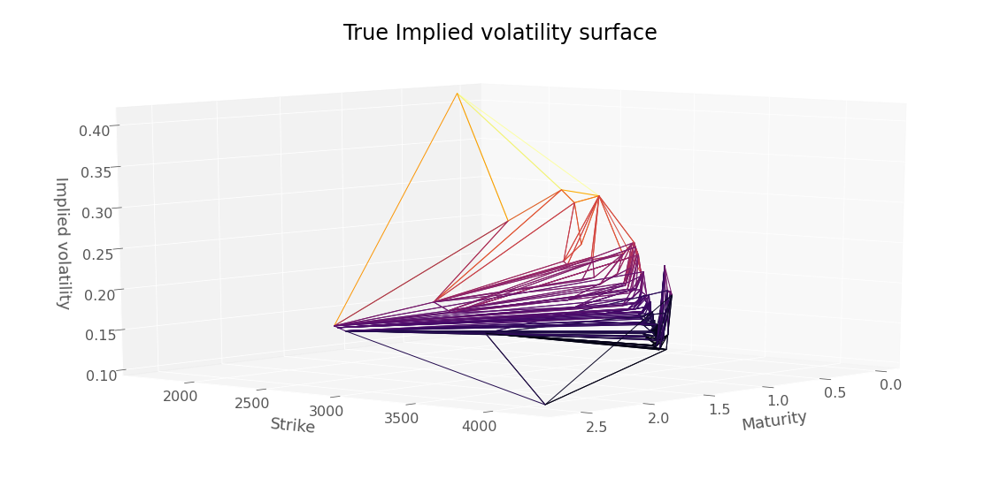

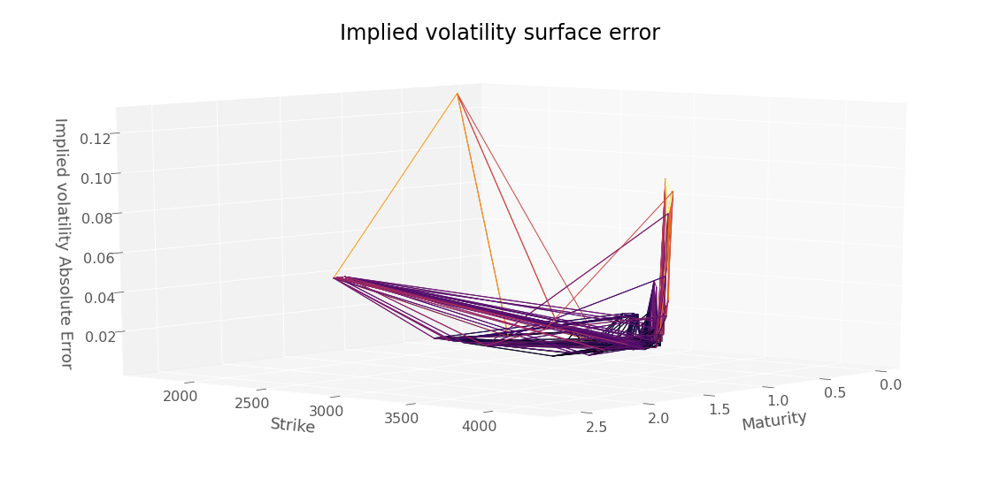

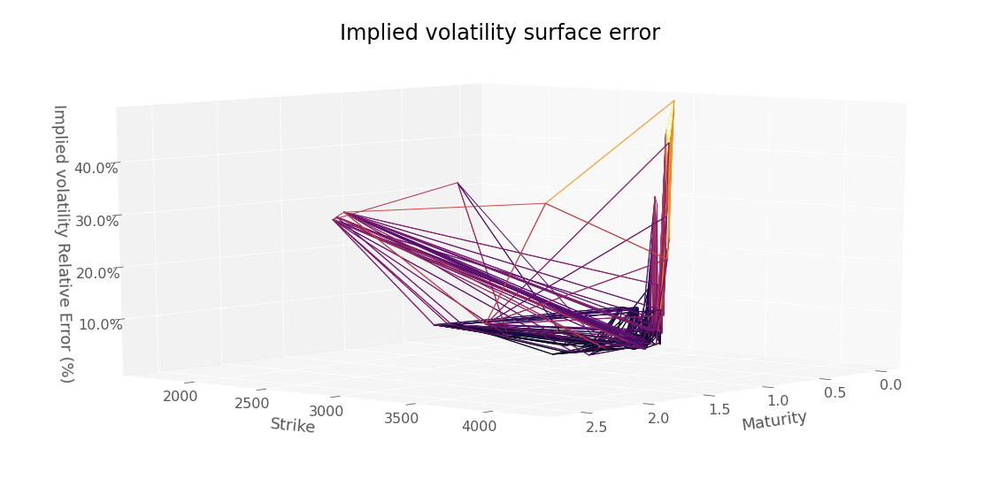

RMSE :  0.020369803717687155


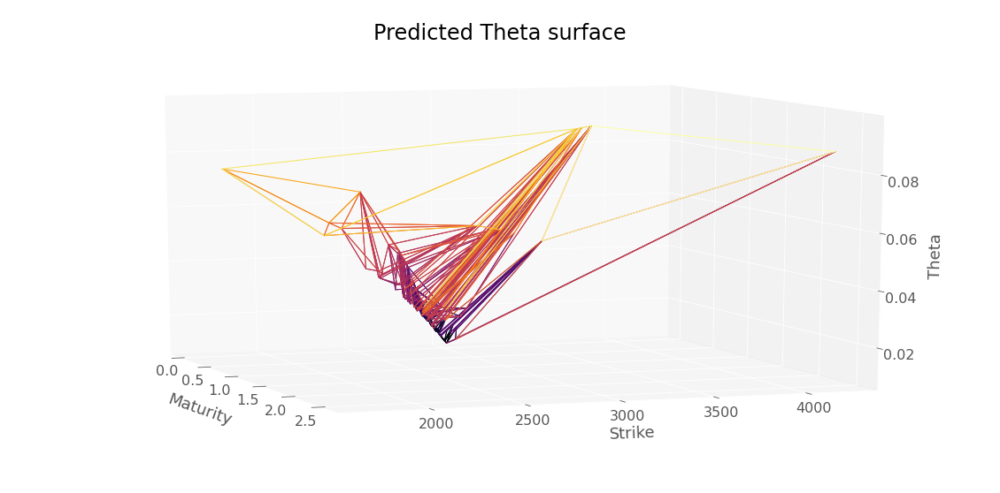

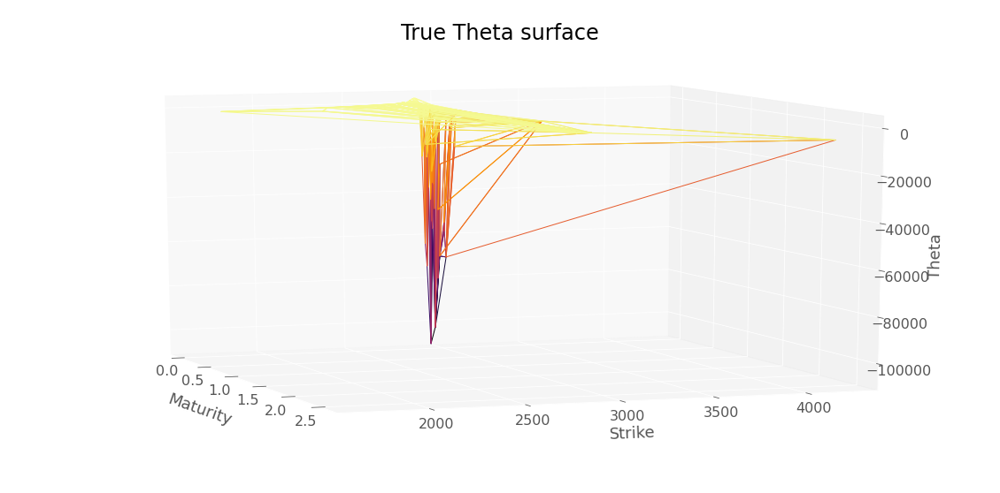

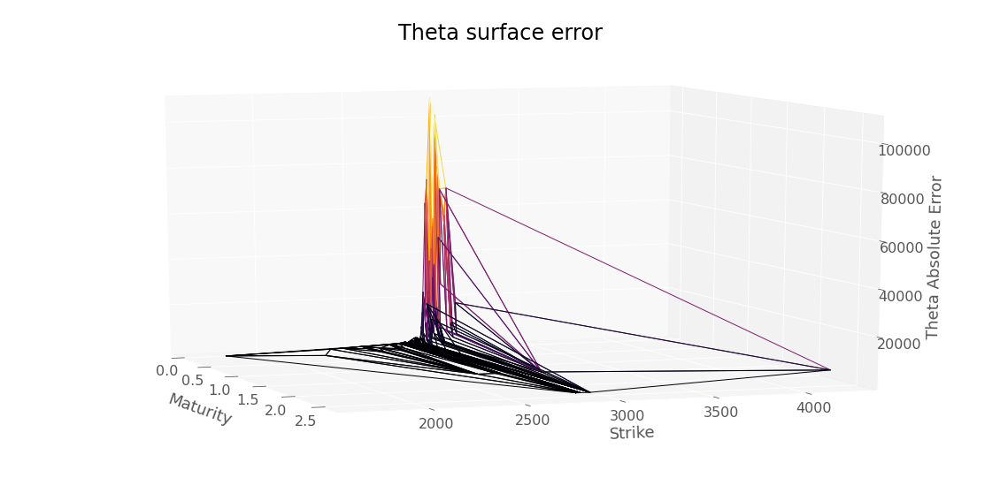

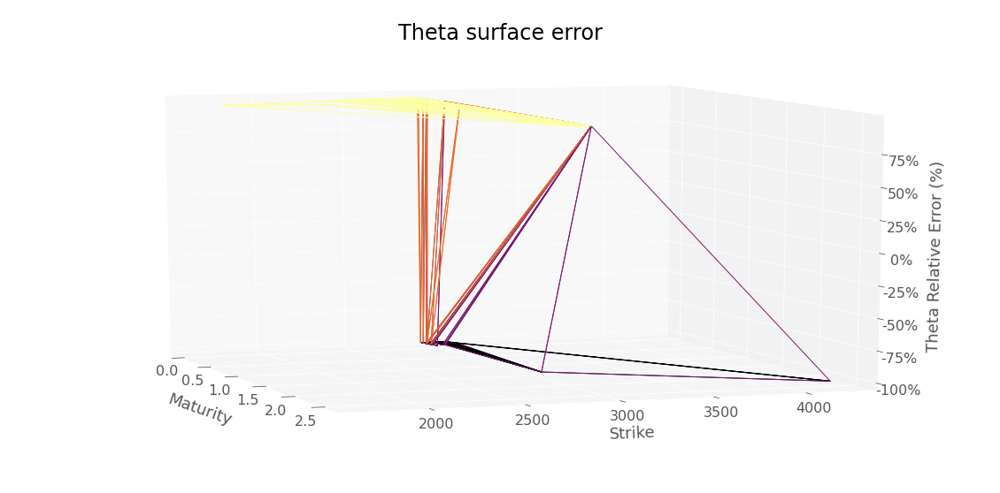

RMSE :  22550.12837091178


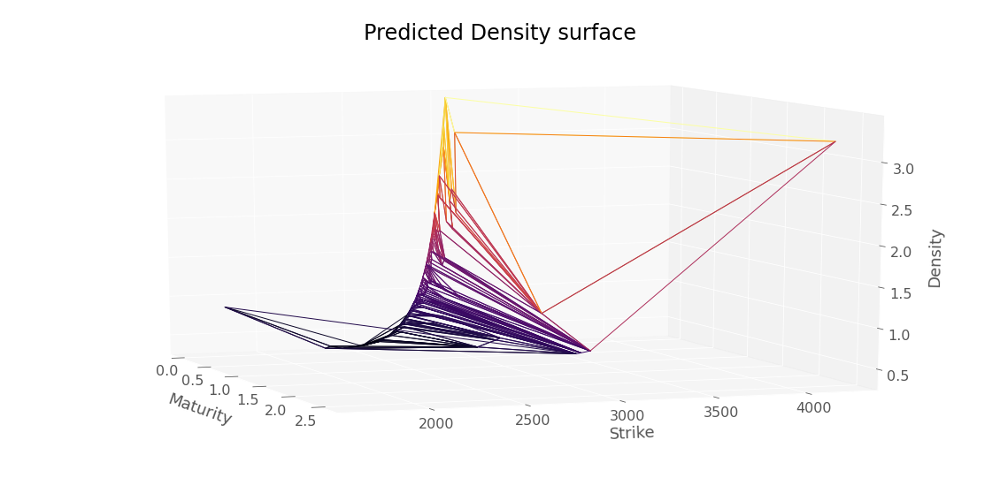

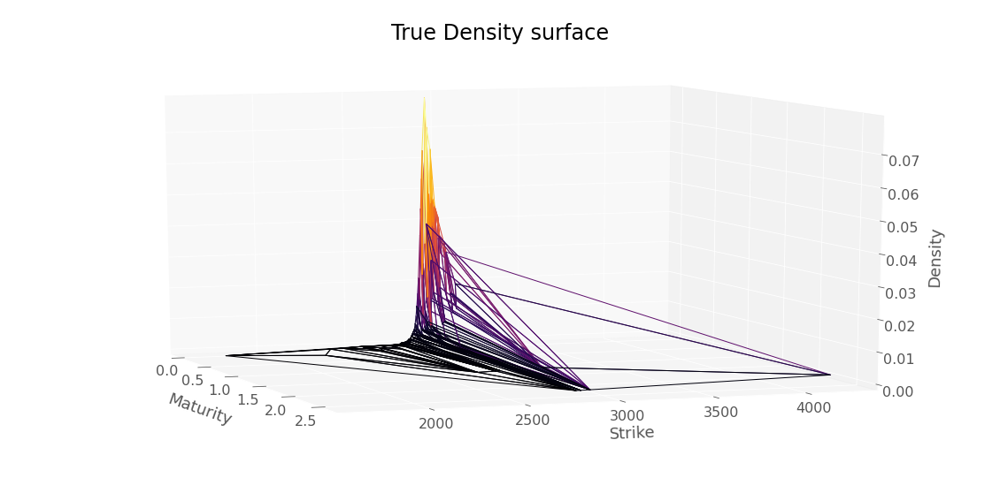

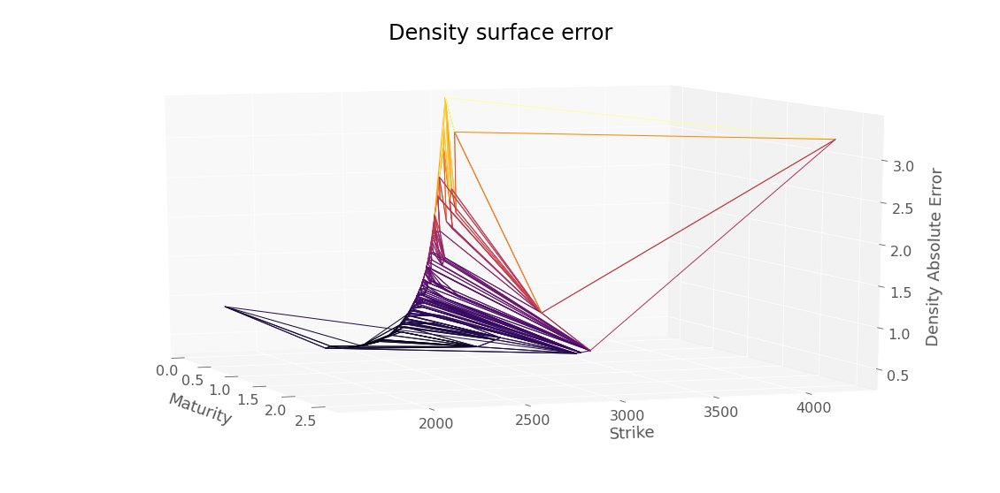

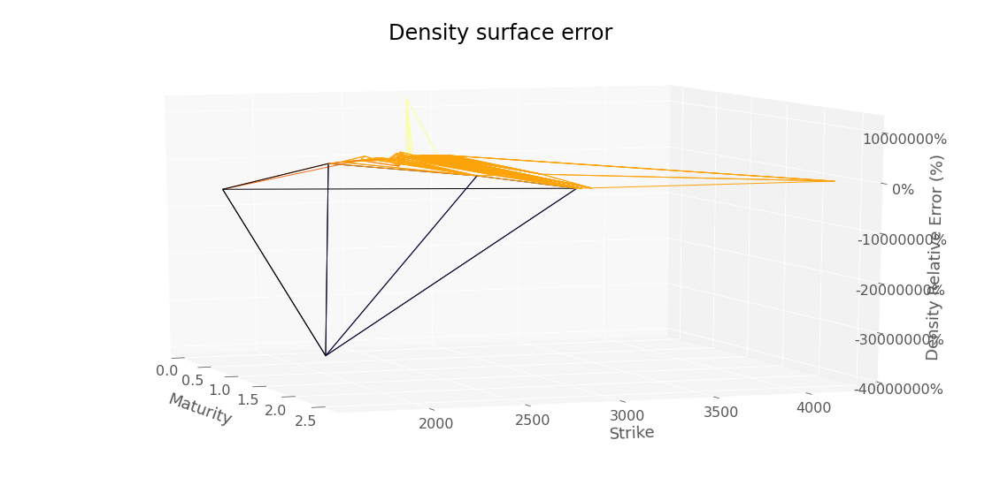

RMSE :  1.2681459606790575


In [36]:
res = neuralNetwork.create_eval_model_gatheral(neuralNetwork.NNArchitectureVanillaSoftGatheral,
                                               scaledDataSetTest,
                                               True,
                                               hyperparameters,
                                               scaler,
                                               modelName = "convexSoftGatheralVolModel")
y_pred4TestG, volLocale4TestG, dNN_T4TestG, gNN_K4TestG, lossSerie4TestG = res

plotTools.modelSummaryGatheral(y_pred4TestG, 
                               volLocale4TestG, 
                               dNN_T4TestG, 
                               gNN_K4TestG, 
                               dataSetTest,
                               yMin = KMin,
                               yMax = KMax)
neuralNetwork.saveDataModel(y_pred4TestG, 
                            volLocale4TestG, 
                            dNN_T4TestG, 
                            "convexSoftGatheralVolModelTest")

In [ ]:
plotTools.modelSummaryGatheral(y_pred4G[y_pred4G.index.get_level_values("Maturity") >= 0.19], 
                               volLocale4G[volLocale4G.index.get_level_values("Maturity") >= 0.19], 
                               dNN_T4G[dNN_T4G.index.get_level_values("Maturity") >= 0.19], 
                               gNN_K4G[gNN_K4G.index.get_level_values("Maturity") >= 0.19], 
                               dataSet[dataSet.index.get_level_values("Maturity") > 0.19],
                               logMoneynessScale = True)

In [ ]:
plotTools.modelSummaryGatheral(y_pred4TestG, 
                               volLocale4TestG, 
                               dNN_T4TestG, 
                               gNN_K4TestG, 
                               dataSetTest[dataSetTest.index.get_level_values("Maturity") > 0.01],
                               logMoneynessScale = True)

#### Monte Carlo and PDE repricing backtests

In [41]:
S0

2859.53

In [53]:
def neuralVolLocaleGatheral(s,t):
    vLoc = neuralNetwork.evalVolLocaleGatheral(neuralNetwork.NNArchitectureVanillaSoftGatheral,
                                               s, t,
                                               dataSet,
                                               hyperparameters,
                                               scaler,
                                               bootstrap,
                                               S0,
                                               modelName = "convexSoftGatheralVolModel")
    return vLoc.dropna()

In [62]:
strikeLow = dataSet["Strike"].min()#min(dataSet["Strike"].min(),dataSetTest["Strike"].min())
strikeUp = dataSet["Strike"].max()#max(dataSet["Strike"].max(),dataSetTest["Strike"].max())
strikeGrid = np.linspace(strikeLow, strikeUp, 100)
matLow = dataSet["Maturity"].min()#min(dataSet["Maturity"].min(),dataSetTest["Maturity"].min())
matUp = dataSetTest["Maturity"].max()#max(dataSet["Maturity"].max(),dataSetTest["Maturity"].max())
matGrid = np.linspace(matLow, matUp, 100)
volLocaleGrid = np.meshgrid(strikeGrid, matGrid)

In [63]:
volLocalInterp7 = neuralVolLocaleGatheral(volLocaleGrid[0].flatten(),
                                          volLocaleGrid[1].flatten())
volLocalInterp7.head()

Strike       Maturity
2300.000000  0.005       0.379639
2308.080808  0.005       0.389517
2316.161616  0.005       0.399416
2324.242424  0.005       0.409295
2332.323232  0.005       0.419111
dtype: float32

In [64]:
volLocalInterp8 = neuralVolLocaleGatheral(dataSetTest.index.get_level_values("Strike").values.flatten(),
                                          dataSetTest.index.get_level_values("Maturity").values.flatten())
volLocalInterp8.head()

Strike  Maturity
1700.0  0.246       0.283991
2200.0  0.419       0.355868
2325.0  0.112       0.393319
2400.0  0.093       0.409688
2510.0  0.170       0.318026
dtype: float32

In [65]:
nnVolLocale7 = lambda x,y : backtest.interpolatedMCLocalVolatility(volLocalInterp7, x, y)

In [66]:
nnVolLocale8 = lambda x,y : backtest.interpolatedMCLocalVolatility(volLocalInterp8, x, y)

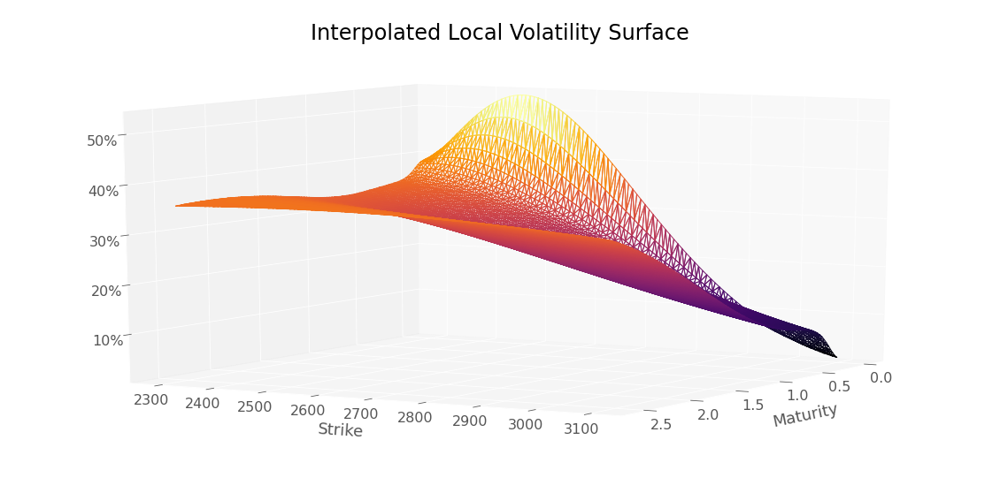

In [67]:
plotTools.plotSerie(volLocalInterp7,
                    Title = 'Interpolated Local Volatility Surface',
                    az=30,
                    yMin=KMin,
                    yMax=KMax,
                    zAsPercent=True)

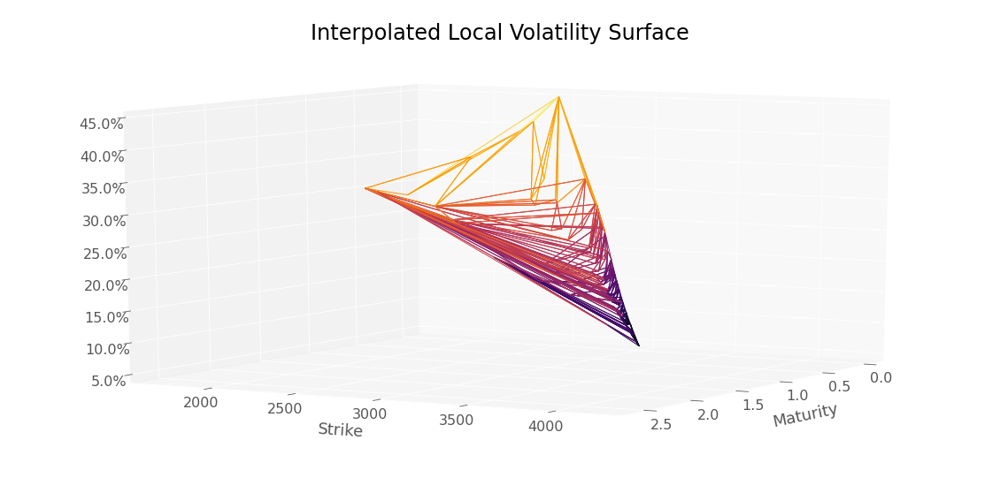

In [68]:
plotTools.plotSerie(volLocalInterp8,
                    Title = 'Interpolated Local Volatility Surface',
                    az=30,
                    yMin=KMin,
                    yMax=KMax,
                    zAsPercent=True)

In [71]:
nbTimeStep = 100
nbPaths = 100000

In [72]:
mcResVolLocale7 = backtest.MonteCarloPricerVectorized(S0,
                                                      dataSetTest,
                                                      bootstrap,
                                                      nbPaths,
                                                      nbTimeStep,
                                                      nnVolLocale7)
mcResVolLocale7.head()

Strike  Maturity
1700.0  0.246       0.068313
2200.0  0.419       8.874072
2325.0  0.112       1.331765
2400.0  0.093       1.696658
2510.0  0.170       9.085843
dtype: float64

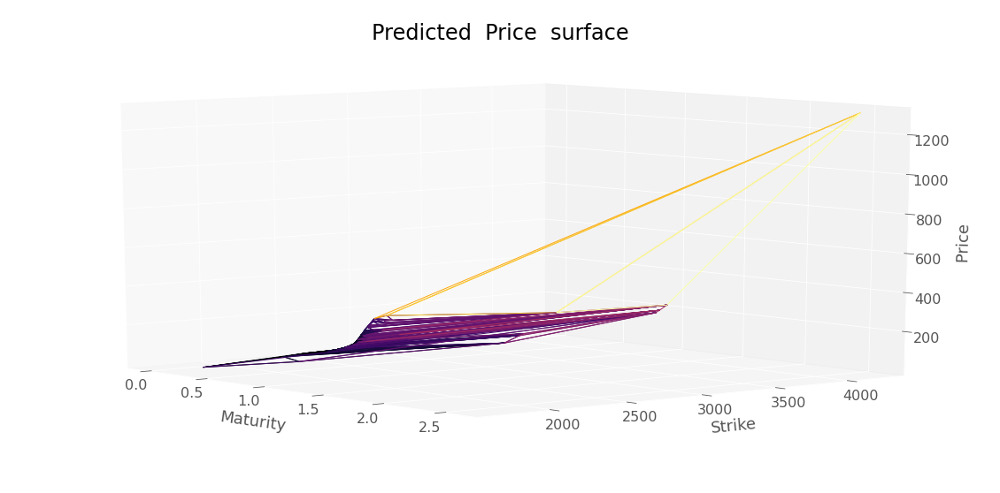

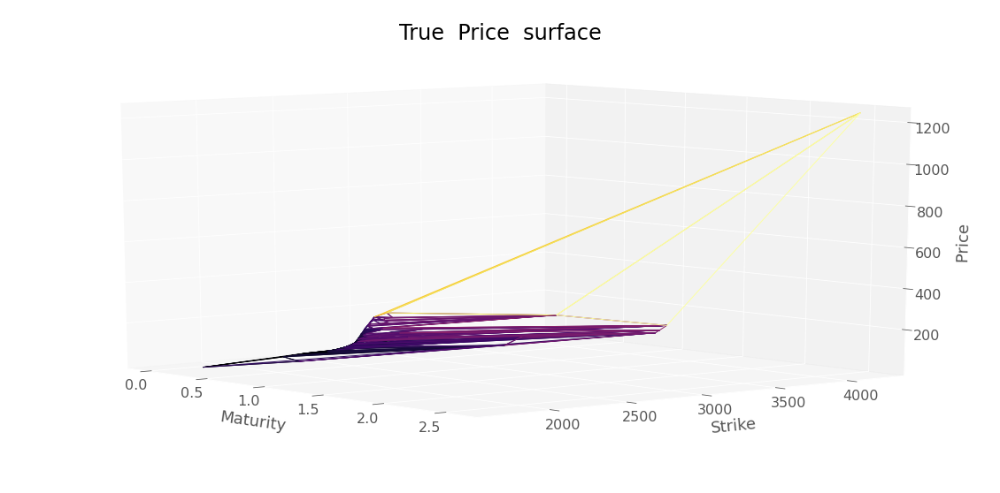

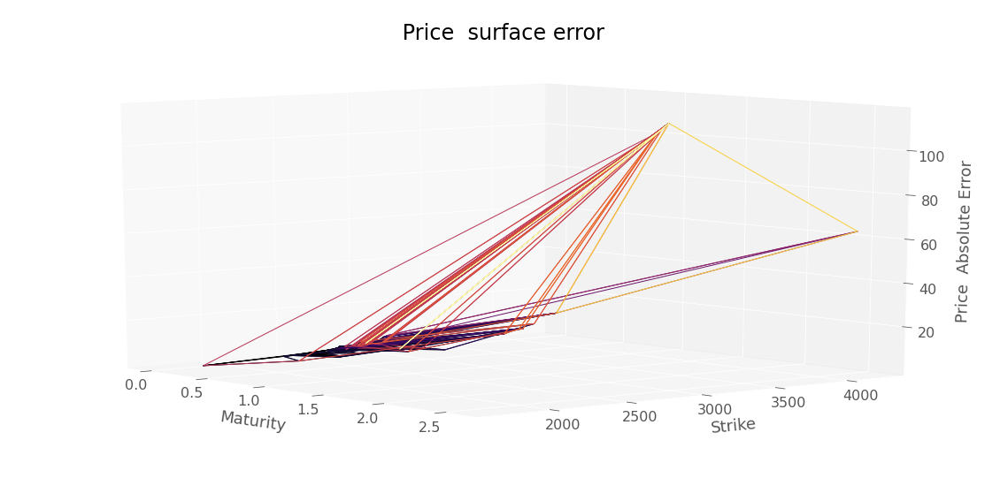

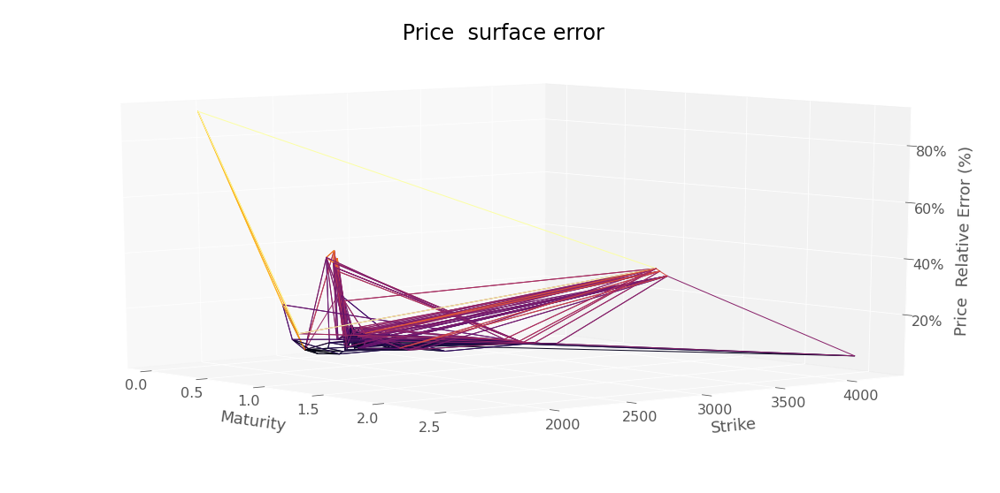

RMSE :  18.090587461376625


In [74]:
plotTools.predictionDiagnosis(mcResVolLocale7, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax = KMax)

In [75]:
mcResVolLocale7.to_csv("mcResVolLocale7.csv")

In [78]:
mcResVolLocale8 = backtest.MonteCarloPricerVectorized(S0,
                                                      dataSetTest,
                                                      bootstrap,
                                                      nbPaths,
                                                      nbTimeStep,
                                                      nnVolLocale8)
mcResVolLocale8.head()

Strike  Maturity
1700.0  0.246       0.019503
2200.0  0.419       9.004030
2325.0  0.112       1.519184
2400.0  0.093       1.820300
2510.0  0.170       9.942921
dtype: float64

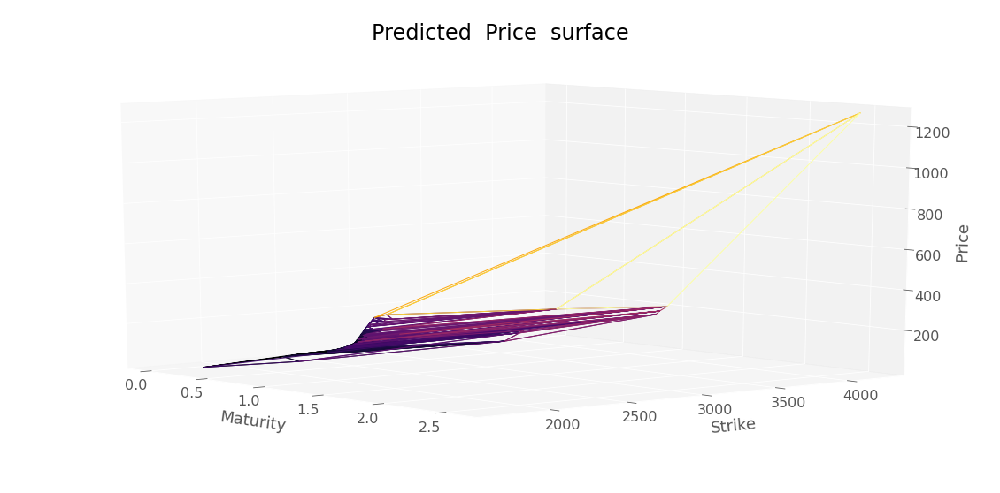

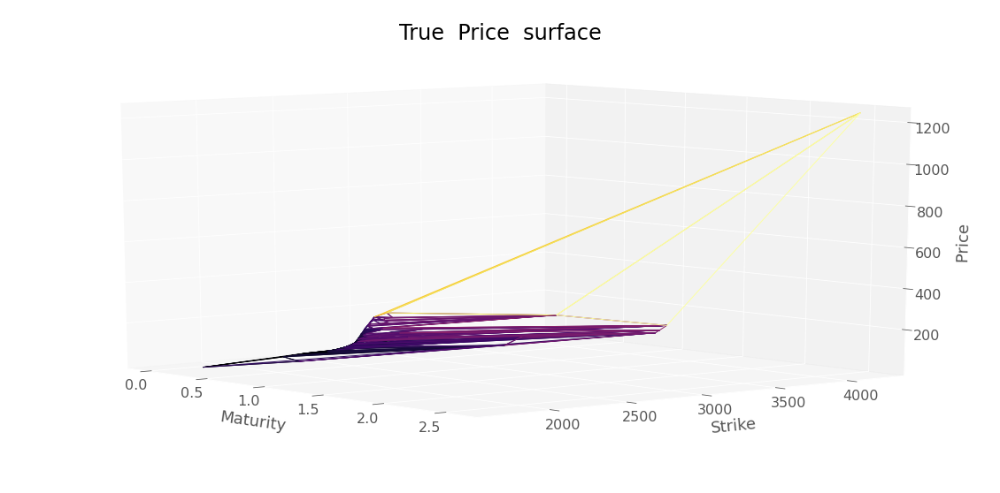

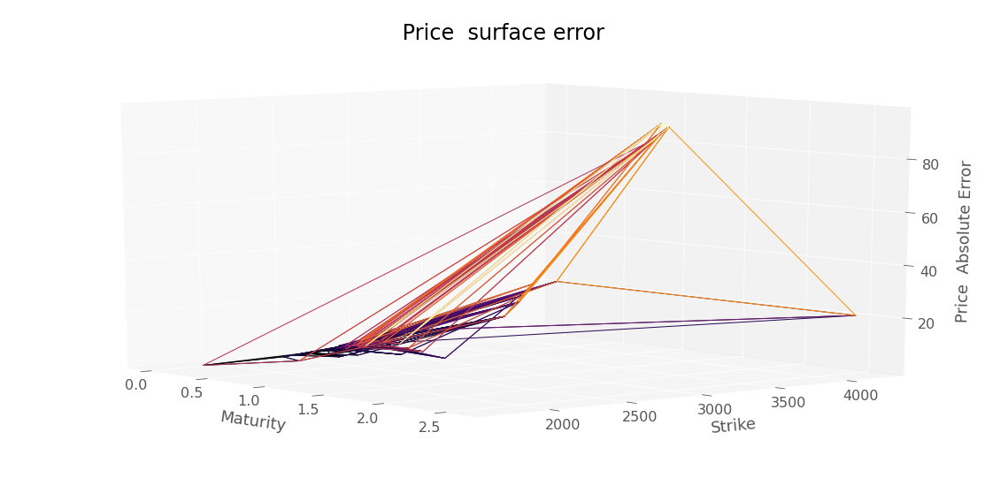

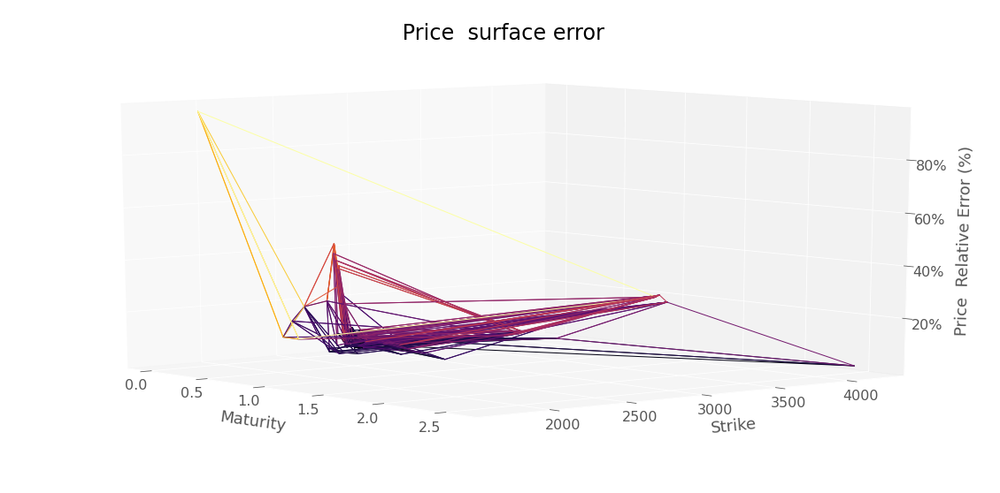

RMSE :  15.163110240499858


In [79]:
plotTools.predictionDiagnosis(mcResVolLocale8, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax = KMax)

In [81]:
mcResVolLocale8.to_csv("mcResVolLocale8.csv")

# Hyperparameter selection

In [ ]:
neuralNetwork.selectHyperparametersRandom(hyperparameters,
                                          ["lambdaLocVol","lambdaSoft","lambdaGamma"],
                                          neuralNetwork.NNArchitectureVanillaSoftGatheral,
                                          "hyperParameters",
                                          True, 
                                          100,
                                          scaledDataSet,
                                          scaler,
                                          trainedOnPrice = False,
                                          logGrid = True)

lambdaLocVol  :  0.10000000000000002
lambdaSoft  :  9.999999999999997e-06
lambdaGamma  :  1000.0000000000002
Iteration :  380 new learning rate :  0.010000000000000002
Best loss (hidden nodes: 50, iterations: 381): -6.66
Best Penalization :  [0.0012736307, [6.741174e-09, 0.0, 9.1158345e-06]]
Iteration :  513 new learning rate :  0.0010000000000000002
Best loss (hidden nodes: 50, iterations: 514): -6.95
Best Penalization :  [0.00096182676, [2.366536e-09, 0.0, 0.0]]
Best loss (hidden nodes: 50, iterations: 1000): -7.84
Best Penalization :  [0.0003935813, [0.0, 0.0, 0.0]]
Training Time :  27.100327968597412
loss :  -7.8402228355407715
nbArbitrageViolation :  0



lambdaLocVol  :  0.01
lambdaSoft  :  9.999999999999995e-07
lambdaGamma  :  9.999999999999998
Iteration :  209 new learning rate :  0.010000000000000002
Best loss (hidden nodes: 50, iterations: 210): -6.03
Best Penalization :  [0.0023911684, [4.0400545e-09, 0.0, 2.7462302e-06]]
Iteration :  531 new learning rate :  0.0010000000000

In [ ]:
#hyperparameters["lambdaLocVol"] = 100
#hyperparameters["lambdaSoft"] = 100 
#hyperparameters["lambdaGamma"] = 10000
hyperparameters["lambdaLocVol"] = 0.01#0.01 #100
hyperparameters["lambdaSoft"] = 0.01#10#10 #100 
hyperparameters["lambdaGamma"] = 100#10 #10000

In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "lambdaLocVol", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = True)

In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "DupireVarCap", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = True)

In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "lambdaLocVol", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = True)

In [ ]:
hyperparameters["lambdaLocVol"] = 100



In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "lambdaLocVol", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = True)

In [ ]:
hyperparameters["nbUnits"] = 40



In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "nbUnits", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = False)

In [ ]:
hyperparameters["nbUnits"] = 200


In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "lambdaLocVol", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = True)

In [ ]:
hyperparameters["nbUnits"] = 40

In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "nbUnits", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = False)

In [ ]:
hyperparameters["nbUnits"] = 200